
<img src="dat/estaes.png">



# **Trabajo Final de Data Science** 

## * Librerías usadas :


In [ ]:
############################
#-----    Instalar    -----#
############################

!pip install langdetect
!pip install wordcloud
nltk.download('stopwords')
!pip install -U ggplot
!pip install plotnine
!pip install lightgbm
!pip install -U spacy
!python -m spacy download en
!python -m spacy download es
!python -m spacy download en_core_web_sm

In [113]:
################################
#----- Carga de Librerías -----#
################################

## Genéricas ##
import numpy as np
import pandas as pd
import datetime as dt
import re
import warnings
warnings.filterwarnings('ignore')

## Visualización
from plotnine import *
import folium
import seaborn as sns
from IPython.display import Image, HTML
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

## Análisis de Datos - Modelamiento
from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import ExtraTreesRegressor

from sklearn.tree import DecisionTreeRegressor 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from langdetect import detect
import nltk
from nltk.corpus import stopwords


## Etapa 1 - Extracción de datos :

### * Carga de todos los datasets 

In [4]:
#####################################
#----- Carga de datos Listings -----#
#####################################

ciudades = ['Barcelona', 'Euskadi', 'Girona', 'Madrid', 'Malaga', 'Mallorca', 'Menorca', 
            'Sevilla', 'Valencia']
tmp = []
for i in range(len(ciudades)):
    a = 'listings_'
    b = ciudades[i]
    c = '.csv.gz'
    d = a+b+c
    res = pd.read_csv("DB_listings/"+d,compression='gzip', error_bad_lines=False, parse_dates=["last_review","first_review"], 
                      dtype = {"id":"str", "host_id":"str", "name":"str", "description":"str",
                                                                             "space":"str", "summary": "str","neighborhood_overview":"str"})
    res['city']= b
    tmp.append(res)

listings_complete = pd.DataFrame([])
for i in range(len(ciudades)):
    listings_complete = listings_complete.append(tmp[i])

In [5]:
#listings_complete.info()
pd.set_option('display.max_columns', None)
print(listings_complete.shape)
listings_complete.head(1)

(109137, 106)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,23197,https://www.airbnb.com/rooms/23197,20200316025159,2020-03-16,Forum DeLuxe 5 mins Walk To CCIB Center & Sea★,I do not accept groups of young people under 2...,Elegant spacious apartment suitable for 6. Amp...,I do not accept groups of young people under 2...,none,Strategically located in the area of Parc del ...,"As a Superhost, I aim to make your stay as com...","Tram T4 Campus Diagonal- Besos, over the ro...",You book the entire apartment for yourselves.,"Please do contact Tony, your check-in manager,...",I do not accept groups of young people under 2...,NaN,NaN,https://a0.muscache.com/im/pictures/738532/806...,NaN,90417,https://www.airbnb.com/users/show/90417,Etain (Marnie),2010-03-09,"Catalonia, Spain","Hi. I'm Etain, though everyone calls me by my...",within an hour,100%,100%,t,https://a0.muscache.com/im/users/90417/profile...,https://a0.muscache.com/im/users/90417/profile...,El Besòs i el Maresme,5.0,5.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Sant Adria de Besos, Barcelona, Spain",Sant Martí,el Besòs i el Maresme,Sant Martí,Barcelona,Barcelona,08930,Barcelona,"Sant Adria de Besos, Spain",ES,Spain,41.41291,2.22063,f,Apartment,Entire home/apt,6,2.0,3.0,5.0,Real Bed,"{TV,Internet,Wifi,""Wheelchair accessible"",Kitc...",NaN,$220.00,NaN,NaN,$300.00,$80.00,3,$10.00,3,30,3,7,1125,1125,3.2,1125.0,6 days ago,t,30,60,85,343,2020-03-16,52,17,2011-03-15,2019-12-15,95.0,10.0,10.0,10.0,10.0,9.0,9.0,t,HUTB-005057,NaN,t,f,strict_14_with_grace_period,f,t,2,2,0,0,0.47


In [6]:
pd.set_option('display.max_rows', None)
missing_percent=round(listings_complete[listings_complete["last_review"]>="2018-01-01"].isnull().sum()*100/len(listings_complete[listings_complete["last_review"]>="2018-01-01"]),2)
var_sum=pd.DataFrame({"variable":listings_complete.columns,"type_of_var":listings_complete.dtypes,
                      "missing_percent":missing_percent}).sort_values("missing_percent", ascending=False).reset_index()
var_sum_list=var_sum.drop(columns="index")

### * Carga de los Reviews

In [7]:
#####################################
#-----  Carga de datos Reviews -----#
#####################################

tmp = []
for i in range(len(ciudades)):
    a = 'reviews_'
    b = ciudades[i]
    c = '.csv.gz'
    d = a+b+c
    res = pd.read_csv("DB_Reviews/"+d,compression='gzip', error_bad_lines=False, parse_dates=["date"])
    tmp.append(res)

reviews_complete = pd.DataFrame([])
for i in range(len(ciudades)):
    reviews_complete = reviews_complete.append(tmp[i])

In [8]:
reviews_complete.head(1)

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,23197,199839,2011-03-15,409630,Tim,We (5 friends) were staying for a conference i...


In [9]:
pd.set_option('display.max_rows', None)
missing_percent=round(reviews_complete.isnull().sum()*100/len(reviews_complete),2)
var_sum=pd.DataFrame({"variable":reviews_complete.columns,"type_of_var":reviews_complete.dtypes,
                      "missing_percent":missing_percent}).sort_values("missing_percent", ascending=False).reset_index()
var_sum.drop(columns="index")

,variable,type_of_var,missing_percent
0,comments,object,0.05
1,listing_id,int64,0.00
2,id,int64,0.00
3,date,datetime64[ns],0.00
4,reviewer_id,int64,0.00
5,reviewer_name,object,0.00


## Etapa 2 - Preprocesamiento de Datos :

### * Wrangling


In [10]:
# Cambiar el X's a float.

listings_complete[['price','security_deposit','cleaning_fee','extra_people',
                   'host_response_rate','host_acceptance_rate']] = listings_complete[['price','security_deposit',
                                                                                                   'cleaning_fee','extra_people','host_response_rate','host_acceptance_rate']].replace('[\$,%]', '', regex=True).astype(float)
listings_complete['host_is_superhost']=listings_complete['host_is_superhost'].apply(lambda x: 1 if x=='t' else 0).astype(int)

#Transformar en string

listings_complete["amenities"]=listings_complete["amenities"].replace('[\\"\\{\\}]',"",regex=True)
listings_complete["host_verifications"]=listings_complete["host_verifications"].replace("[\\'\\[\\]]","",regex=True)
listings_complete[['name','description']] = listings_complete[['name','description']].astype(str)

#Extraer el año: Haciendo más amigable la lectura del campo de la fecha de última estancia

listings_complete['year'] = listings_complete['last_review'].apply(lambda x: x.year)
listings_complete['year_month'] = listings_complete['last_review'].dt.to_period('M')

# Reasignando etiquetas

listings_complete['cancellation_policy']=listings_complete['cancellation_policy'].apply(lambda x : "strict_14_with_grace_period" if x=="strict" else x)
listings_complete['cancellation_policy']=listings_complete['cancellation_policy'].apply(lambda x : "super_strict_30_60" if (x=="super_strict_60" or x=="super_strict_30" ) else x)

listings_complete['host_response_time']=listings_complete['host_response_time'].replace( "[\\s]","_",regex=True)

In [11]:
listings_complete.require_guest_phone_verification.value_counts()

f    107316
t      1821
Name: require_guest_phone_verification, dtype: int64

In [12]:
#Primera Purga de Variables y periodo adecuado

missing_high=var_sum_list[var_sum_list["missing_percent"]>35]
missing_high=list(missing_high["variable"])
print(missing_high)
listings=listings_complete[listings_complete["year"]>=2018].drop(columns=missing_high, axis=1)

['medium_url', 'thumbnail_url', 'xl_picture_url', 'jurisdiction_names', 'square_feet', 'monthly_price', 'weekly_price', 'host_neighbourhood', 'notes', 'access', 'neighbourhood', 'interaction', 'host_about', 'transit', 'license', 'neighbourhood_group_cleansed']


In [13]:
pd.set_option("display.max_rows", None)
#set(listings_complete["host_verifications"])
listings.head(2)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,house_rules,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,year,year_month
0,23197,https://www.airbnb.com/rooms/23197,20200316025159,2020-03-16,Forum DeLuxe 5 mins Walk To CCIB Center & Sea★,I do not accept groups of young people under 2...,Elegant spacious apartment suitable for 6. Amp...,I do not accept groups of young people under 2...,none,Strategically located in the area of Parc del ...,I do not accept groups of young people under 2...,https://a0.muscache.com/im/pictures/738532/806...,90417,https://www.airbnb.com/users/show/90417,Etain (Marnie),2010-03-09,"Catalonia, Spain",within_an_hour,100.0,100.0,1,https://a0.muscache.com/im/users/90417/profile...,https://a0.muscache.com/im/users/90417/profile...,5.0,5.0,"email, phone, reviews, jumio, offline_governme...",t,t,"Sant Adria de Besos, Barcelona, Spain",el Besòs i el Maresme,Barcelona,Barcelona,08930,Barcelona,"Sant Adria de Besos, Spain",ES,Spain,41.41291,2.22063,f,Apartment,Entire home/apt,6,2.0,3.0,5.0,Real Bed,"TV,Internet,Wifi,Wheelchair accessible,Kitchen...",220.0,300.0,80.0,3,10.0,3,30,3,7,1125,1125,3.2,1125.0,6 days ago,t,30,60,85,343,2020-03-16,52,17,2011-03-15,2019-12-15,95.0,10.0,10.0,10.0,10.0,9.0,9.0,t,t,f,strict_14_with_grace_period,f,t,2,2,0,0,0.47,2019.0,2019-12
1,25786,https://www.airbnb.com/rooms/25786,20200316025159,2020-03-16,NICE ROOM AVAILABLE IN THE HEART OF GRACIA,JUST GO THROUGH THE MANY REVIEWS I GOT THROUGH...,Room available for rent.- PEDRO PEREZ. Share...,JUST GO THROUGH THE MANY REVIEWS I GOT THROUGH...,none,Solo decir que a menudo ni salgo del barrio. M...,Clean Bathroom after use and quick shower At a...,https://a0.muscache.com/im/pictures/6619f0c7-8...,108310,https://www.airbnb.com/users/show/108310,Pedro,2010-04-14,"Barcelona, Catalonia, Spain",within_an_hour,100.0,100.0,1,https://a0.muscache.com/im/pictures/user/e02a6...,https://a0.muscache.com/im/pictures/user/e02a6...,1.0,1.0,"email, phone, reviews, jumio, offline_governme...",t,t,"Barcelona, Barcelona, Spain",la Vila de Gràcia,Barcelona,Barcelona,08012,Barcelona,"Barcelona, Spain",ES,Spain,41.40145,2.15645,t,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,"TV,Wifi,Air conditioning,Kitchen,Smoking allow...",42.0,NaN,NaN,1,25.0,1,730,1,1,730,730,1.0,730.0,3 days ago,t,13,32,52,117,2020-03-16,274,50,2010-08-11,2020-03-15,95.0,10.0,9.0,10.0,10.0,10.0,10.0,t,t,f,strict_14_with_grace_period,t,t,1,0,1,0,2.34,2020.0,2020-03


In [14]:
#Segunda Purga, variables potencialmente utilizables

listings = listings[['id','listing_url','name', 'space', 'summary','description','picture_url', 'host_id', 'host_is_superhost',
          'host_url','host_response_time','host_response_rate','street', 'host_acceptance_rate','host_listings_count','host_has_profile_pic',
          'calculated_host_listings_count', 'latitude', 'longitude', 'property_type', 'room_type','amenities','security_deposit',
          'cleaning_fee','reviews_per_month','minimum_nights','neighborhood_overview', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price','extra_people',
          'guests_included','maximum_nights','availability_365', 'number_of_reviews', 'number_of_reviews_ltm','calendar_updated',
          'require_guest_phone_verification','review_scores_rating','review_scores_accuracy', 'review_scores_cleanliness','availability_30',
          'availability_60','availability_90','review_scores_checkin','review_scores_communication', 'review_scores_location',
          'require_guest_profile_picture','review_scores_value','city','year','year_month','first_review','last_review','cancellation_policy']]

In [15]:
#Evaluación de tipo de datos de las columnas seleccionadas

pd.set_option('display.max_rows', None)
#types_data = pd.DataFrame(listings.dtypes.reset_index())
#types_data.rename(columns={'index': 'Campos', 0: 'Tipo'}, inplace = True)
missing_percent=round(listings.isnull().sum()*100/len(listings),2)
var_sum=pd.DataFrame({"variable":listings.columns,"type_of_var":listings.dtypes,
                      "missing_percent":missing_percent}).sort_values("missing_percent", ascending=False).reset_index()
var_sum.drop(columns="index")

,variable,type_of_var,missing_percent
0,neighborhood_overview,object,32.47
1,security_deposit,float64,21.58
2,space,object,21.38
3,cleaning_fee,float64,16.11
4,host_response_time,object,9.61
5,host_response_rate,float64,9.61
6,summary,object,3.29
7,host_acceptance_rate,float64,2.37
8,review_scores_accuracy,float64,1.36
9,review_scores_value,float64,1.35


In [16]:
reviews = reviews_complete[['listing_id','date','comments']]
pd.set_option('display.max_rows', None)
missing_percent=round(reviews.isnull().sum()*100/len(reviews),2)
var_sum=pd.DataFrame({"variable":reviews.columns,"type_of_var":reviews.dtypes,
                      "missing_percent":missing_percent}).sort_values("missing_percent", ascending=False).reset_index()
var_sum.drop(columns="index")

,variable,type_of_var,missing_percent
0,comments,object,0.05
1,listing_id,int64,0.00
2,date,datetime64[ns],0.00


In [17]:
reviews[['listing_id']] = reviews[['listing_id']].astype(str)

## Etapa 3 - Análisis Exploratorio de Datos :

### * Estadísticos Descriptivos


#### Vista Panorámica - lugares por Ciudad

In [18]:
#####################################
#-----  Descriptivos -----#
#####################################

from folium.plugins import HeatMap
m = folium.Map(location=[40.42, -3.7], zoom_start=6.2, tiles='cartodbpositron')
heatmap = HeatMap(data=listings[["latitude", "longitude"]], radius=11).add_to(m)
m

Se puede ver claramente cómo estos 9 distintas ciudades, estan distribuidos. Ciudades como Madrid y Barcelona, son ciudades que tienes una alta concentración de Airbnb, por otro lado ciudades como Euskadi y Mallorca son más dispersos.

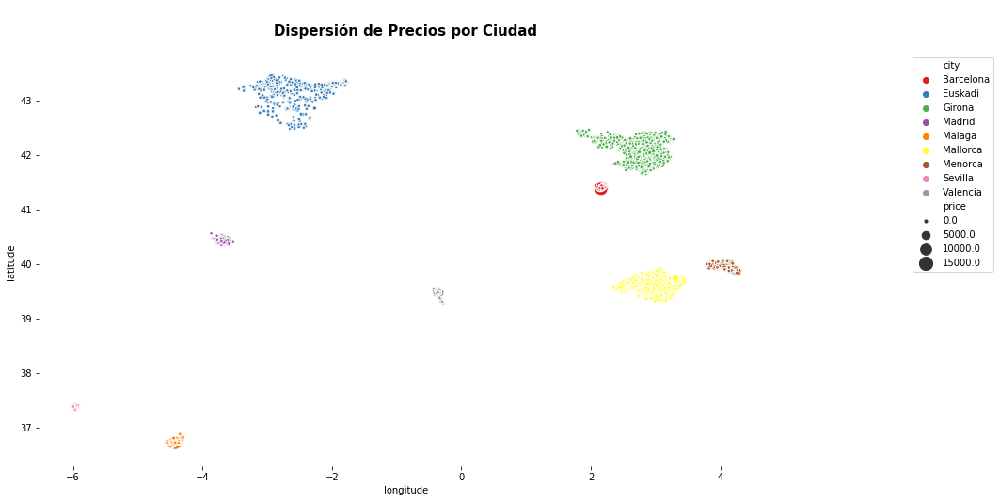

In [19]:
fig, ax = plt.subplots(figsize=(14,8))
ax = sns.scatterplot(x='longitude', y='latitude', data=listings, hue = 'city', size = 'price',sizes=(10, 200), 
                     palette=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf','#999999'])
ax.legend(bbox_to_anchor=(1.3, 1), borderaxespad=0.)
plt.title('\nDispersión de Precios por Ciudad\n', fontsize=15, fontweight='bold')
sns.despine(ax=ax, top=True, right=True, left=True, bottom=True)

In [38]:
fig = px.scatter(listings, x="longitude", y="latitude", color="city", size='price')
fig.update_layout(title={'text': "<b>Dispersión de Precios por Ciudad</b>",'y':0.98,'x':0.5,'xanchor': 'center','yanchor': 'top'})
fig.show()

In [22]:
# Porcentaje de valores vacíos por variable y ciudad
missing_table = pd.DataFrame() 
for  ciudad in ciudades:   
  w = pd.DataFrame(listings[listings["city"]==ciudad].isnull().sum()/len(listings["city"]==ciudad), columns= [ciudad])
  missing_table = pd.concat([w,missing_table],axis= 1) 
missing_table

,Valencia,Sevilla,Menorca,Mallorca,Malaga,Madrid,Girona,Euskadi,Barcelona
id,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
listing_url,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
name,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
space,0.017404,0.012744,0.007107,0.024199,0.015399,0.047747,0.033624,0.014280,0.041304
summary,0.002903,0.001705,0.000586,0.002929,0.001419,0.010206,0.002512,0.002031,0.008604
description,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
picture_url,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
host_id,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
host_is_superhost,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
host_url,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [32]:
listings["log_price"]=listings["price"].apply(lambda x: np.log(x+1))

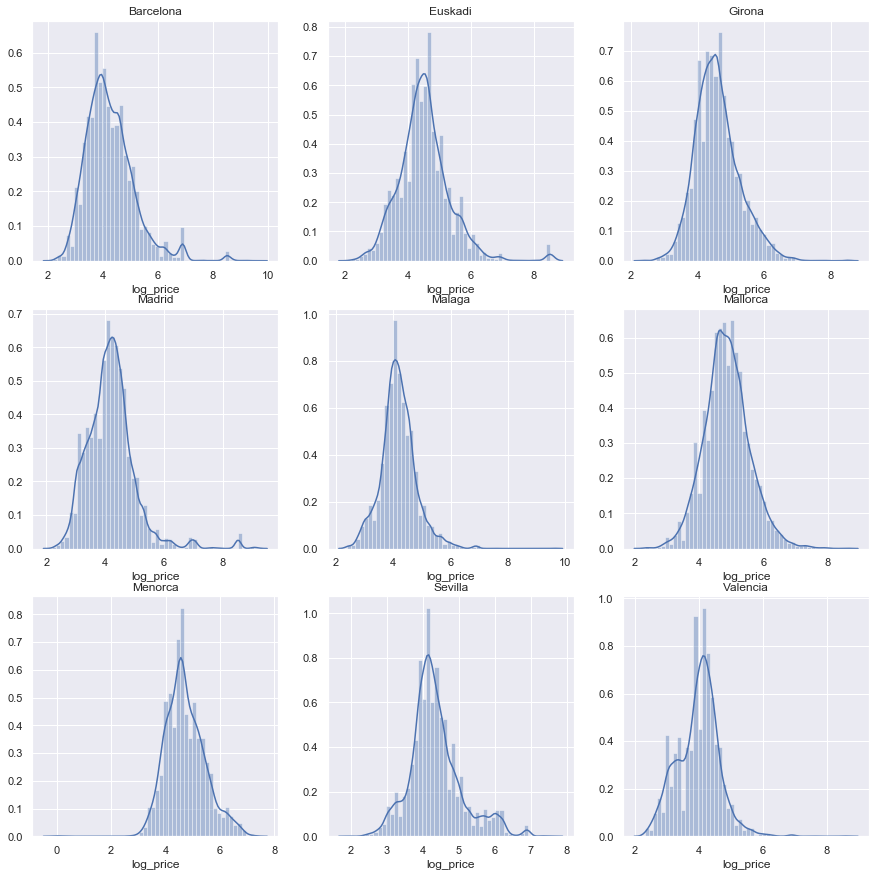

In [33]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,15)) 
etiqueta = 0
for fila in range(0,3):
    for columna in range(0,3):
        sns.distplot(listings[listings['city'] == ciudades[etiqueta]].log_price, ax = axes[fila][columna])
        axes[fila][columna].set_title(ciudades[etiqueta])
        etiqueta = etiqueta + 1
        sns.set(font_scale=1)

plt.show()

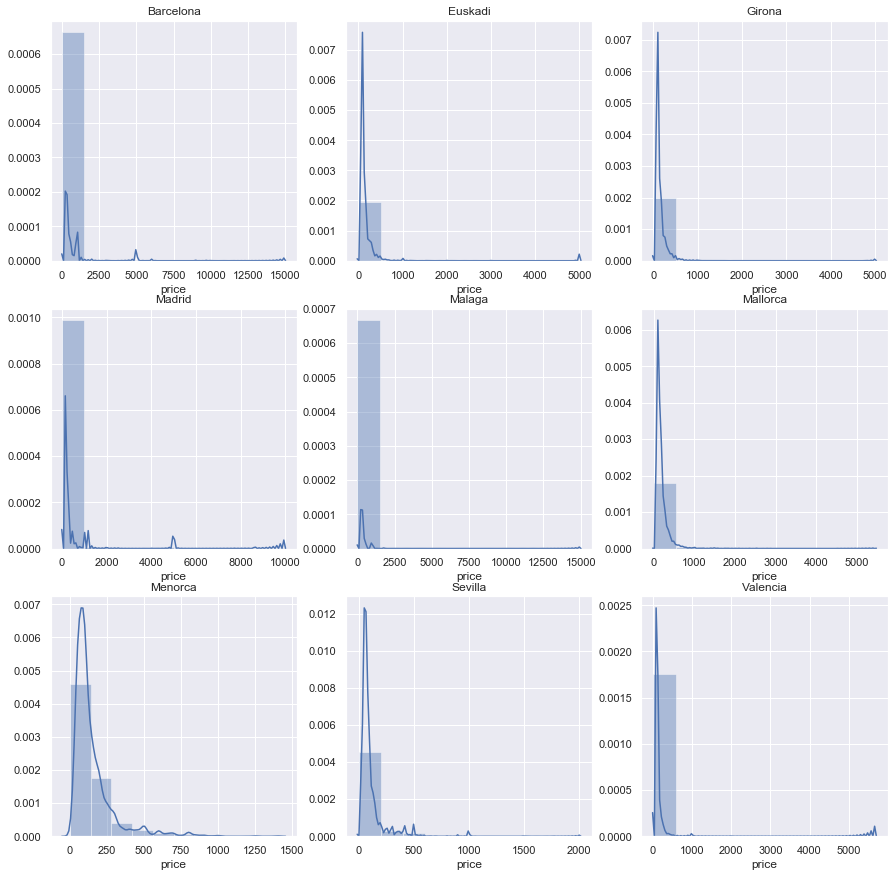

In [34]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,15)) 
etiqueta = 0
for fila in range(0,3):
    for columna in range(0,3):
        sns.distplot(listings[listings['city'] == ciudades[etiqueta]].price, ax = axes[fila][columna], bins = 10)
        axes[fila][columna].set_title(ciudades[etiqueta])
        etiqueta = etiqueta + 1
        sns.set(font_scale=1)

plt.show()

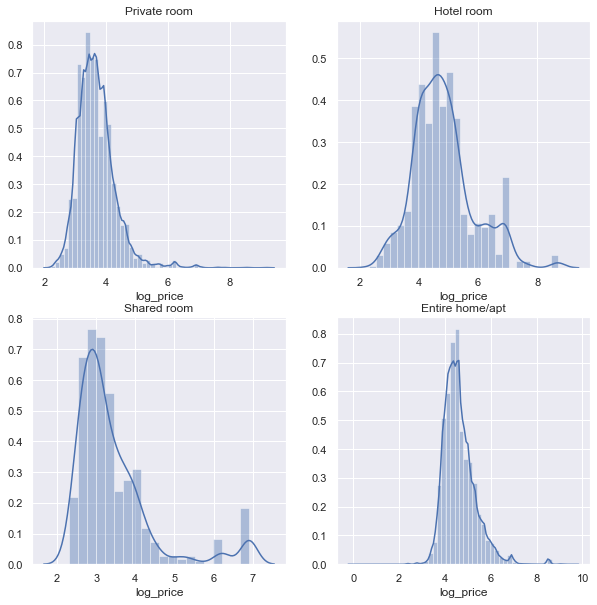

In [35]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (10,10))
types=["Private room","Hotel room","Shared room", "Entire home/apt"]
etiqueta = 0
for fila in range(0,2):
    for columna in range(0,2):
        sns.distplot(listings[listings['room_type'] == types[etiqueta]].log_price, ax = axes[fila][columna])
        axes[fila][columna].set_title(types[etiqueta])
        etiqueta = etiqueta + 1
        sns.set(font_scale=1)

plt.show()

In [36]:
precio_ano_ciudad=listings.groupby(['city','year']).agg({'price':'median','city':'count'}).rename(
    columns={'price':'precio_mediano','city':'conteo'}).reset_index()
precio_ano_mes_ciudad=listings.groupby(['city','year_month']).agg({'price':'median','city':'count'}).rename(
    columns={'price':'precio_mediano','city':'conteo'}).reset_index()

In [37]:
import plotly.express as px
fig = px.scatter(precio_ano_ciudad,x="year", y="precio_mediano",color="city", size="precio_mediano",
                 hover_data=['conteo'],labels={'year':'Año', 'precio_mediano':'price'})
fig.update_layout(title='Precio por Ciudad en el tiempo')
fig.show()

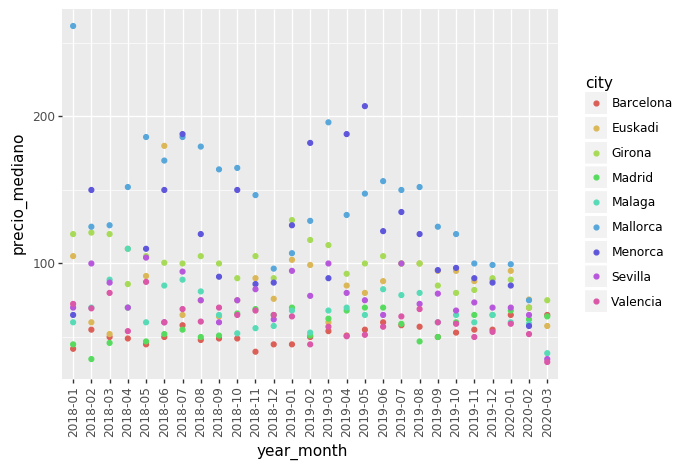

<ggplot: (7649497077)>

In [29]:
ggplot(aes(x='year_month', y='precio_mediano', colour='city'), data=
       precio_ano_mes_ciudad)+geom_point()+theme(axis_text_x = element_text(angle=90))

### Variables Contínuas

In [40]:
corr_table = pd.DataFrame() 
for  ciudad in ciudades:   
  w = pd.DataFrame(listings[listings["city"]==ciudad].drop(columns=["year","longitude","latitude","log_price","price"]).
                   corrwith(listings["log_price"]), columns= [ciudad])
  corr_table = pd.concat([w,corr_table],axis= 1) 
corr_table.reset_index().rename(columns={"index":"variable"})
x = pd.DataFrame(listings.drop(columns=["year","longitude","latitude","log_price","price"]).
                   corrwith(listings["log_price"]),columns=["Total"])
corr_table_x=pd.concat([corr_table,x],axis=1)
corr_table_x

,Valencia,Sevilla,Menorca,Mallorca,Malaga,Madrid,Girona,Euskadi,Barcelona,Total
host_is_superhost,0.005014,-0.000936,0.000609,-0.012922,0.000305,0.007007,-0.013803,-0.001781,0.013742,-0.006676
host_response_rate,0.005658,0.005877,-0.007003,-0.009263,-0.002869,0.002629,-0.004073,0.000950,0.024822,0.022536
host_acceptance_rate,0.001699,0.007057,0.003328,-0.002283,-0.010691,0.022256,-0.016728,0.009658,0.035593,0.046102
host_listings_count,0.020862,0.014635,0.001280,0.012985,0.002358,0.032419,0.009932,0.040539,0.057262,0.154670
calculated_host_listings_count,0.025576,0.025897,0.035687,0.010540,0.012640,0.056761,0.008374,0.039505,0.097495,0.158321
security_deposit,0.022860,0.024071,0.042008,0.071990,0.028589,0.066911,0.057832,0.031449,0.033748,0.252961
cleaning_fee,0.067717,0.048689,0.022062,0.053150,0.038256,0.105653,0.067323,0.030913,0.113952,0.374995
reviews_per_month,-0.015432,-0.034855,-0.020706,-0.066015,-0.035930,-0.019352,-0.051435,-0.035732,-0.017330,-0.210698
minimum_nights,0.006054,-0.014708,0.029895,0.014968,-0.002486,-0.007568,0.017004,-0.008533,-0.014666,-0.025532
accommodates,0.090429,0.067632,0.077810,0.117518,0.060647,0.128699,0.111207,0.074763,0.147522,0.597885


In [41]:
room_type=list(set(listings["room_type"]))

corr_table = pd.DataFrame() 
for  room in room_type:   
  w = pd.DataFrame(listings[listings["room_type"]==room].drop(columns=["longitude","latitude","log_price","price"]).
                   corrwith(listings["price"]), columns= [room])
  corr_table = pd.concat([w,corr_table],axis= 1) 
corr_table.reset_index().rename(columns={"index":"variable"})
x = pd.DataFrame(listings.drop(columns=["longitude","latitude","log_price","price"]).
                   corrwith(listings["log_price"]),columns=["Total"])
corr_table_x=pd.concat([corr_table,x],axis=1)
corr_table_x

,Shared room,Private room,Entire home/apt,Hotel room,Total
host_is_superhost,-0.024537,-0.005071,-0.009303,0.032119,-0.006676
host_response_rate,0.014012,-0.004069,-0.003975,-0.007714,0.022536
host_acceptance_rate,0.041675,-0.002357,0.005043,-0.013624,0.046102
host_listings_count,-0.028187,0.000627,0.012454,-0.034565,0.154670
calculated_host_listings_count,-0.023957,0.001114,0.015882,-0.032248,0.158321
security_deposit,-0.019013,-0.000356,0.033117,0.002677,0.252961
cleaning_fee,-0.030376,-0.003178,0.029310,-0.020560,0.374995
reviews_per_month,0.017670,-0.008609,-0.014938,-0.031731,-0.210698
minimum_nights,-0.008054,0.017534,-0.003076,-0.018597,-0.025532
accommodates,-0.017017,0.005677,0.029931,-0.003818,0.597885


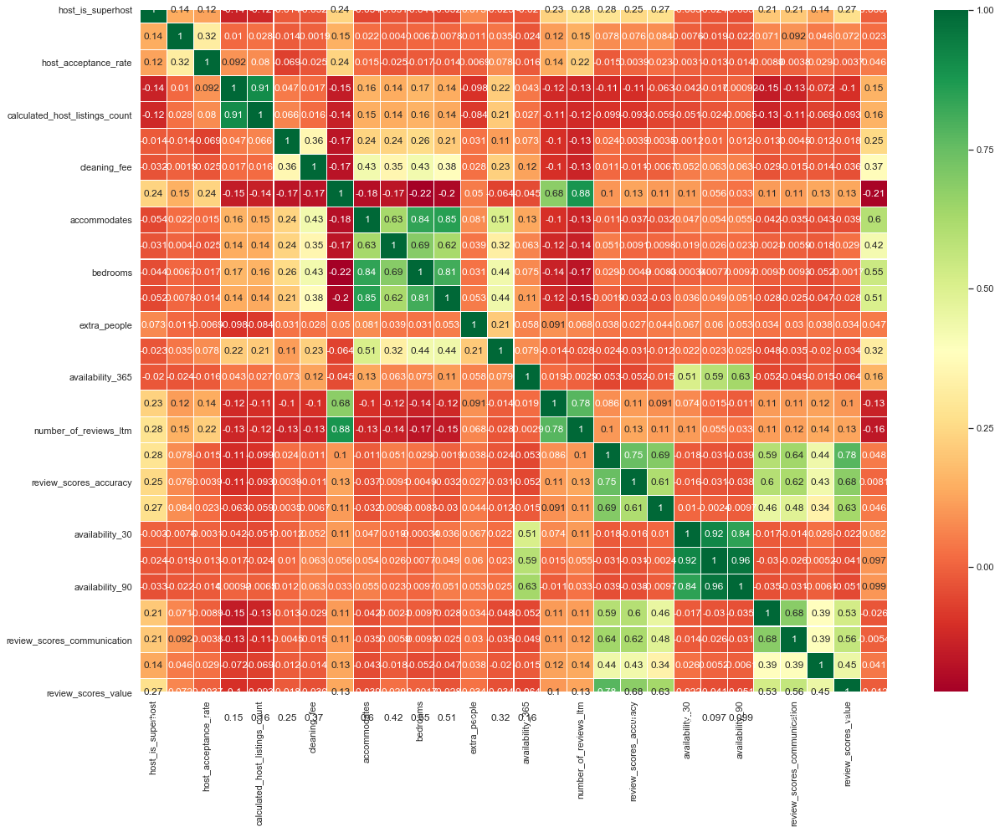

In [42]:
sns.heatmap(listings.drop(columns=["year","longitude","latitude","price","minimum_nights","maximum_nights"]).corr(),annot=True,cmap='RdYlGn',linewidths=0.1)
fig=plt.gcf()
fig.set_size_inches(20,15)
plt.show()

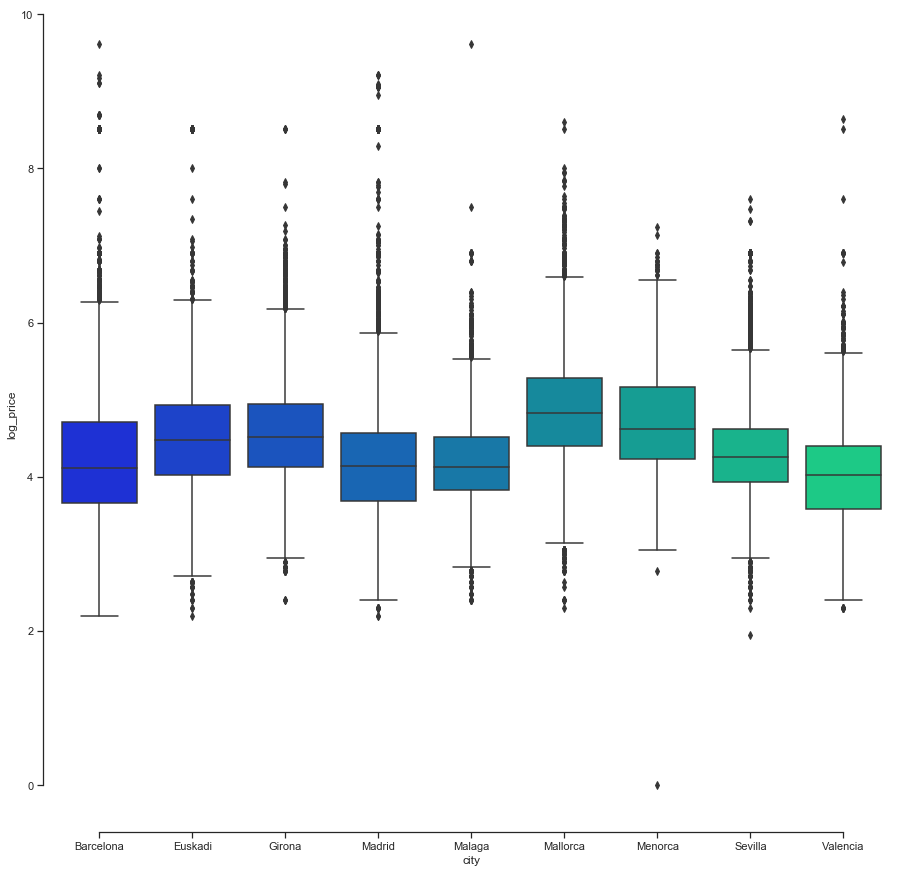

In [43]:
sns.set(style="ticks")
fig, ax = plt.subplots(figsize = (15 , 15))
out = sns.boxplot(x = 'city', y='log_price', data = listings, palette="winter")
sns.set(font_scale=1)
sns.despine(offset=10, trim=True)

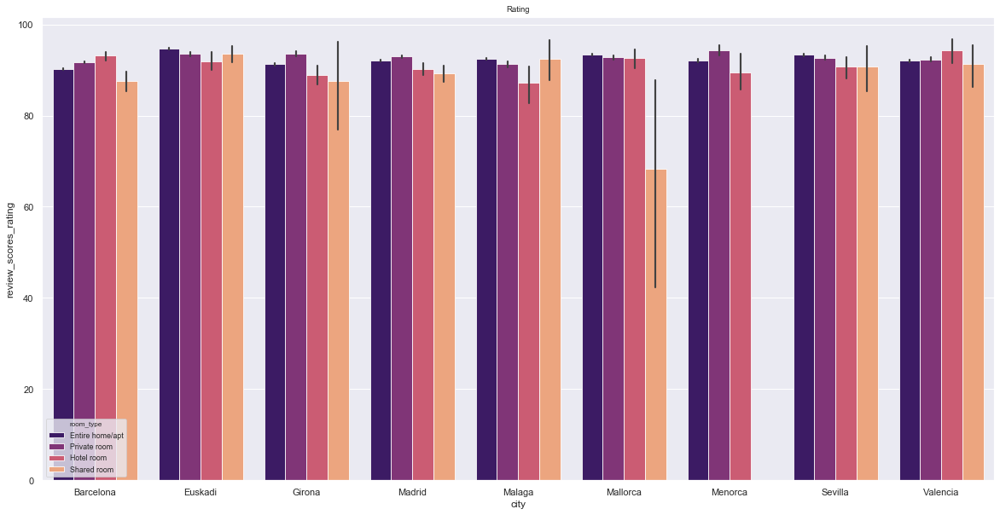

In [44]:
fig, ax = plt.subplots(figsize = (20 , 10))
sns.set_context('paper')
sns.barplot(x = 'city', y = 'review_scores_rating', hue = 'room_type', data = listings, palette = 'magma')
plt.title('Rating')
plt.show()

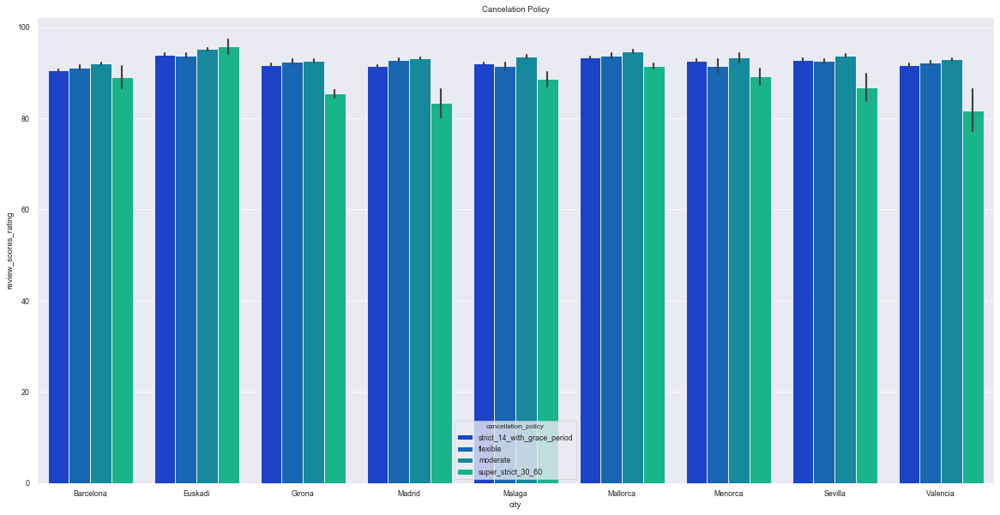

In [162]:
fig, ax = plt.subplots(figsize = (20 , 10))
sns.set_context('paper')
sns.barplot(x = 'city', y = 'review_scores_rating', hue = 'cancellation_policy', data = listings, palette = 'winter')
plt.title('Cancelation Policy')
plt.show()

In [47]:
pd.set_option('display.max_columns', None)
listings_eval = listings.groupby(["city","year"])['number_of_reviews','minimum_nights', 'maximum_nights'].describe(percentiles=[.01,.05,.1,.25,.5,.75,.9,.95,.96,.97,.98,.99]
                                                                                                         ).reset_index()
listings_eval

city    year number_of_reviews                                       \
                                  count       mean        std  min   1%   5%   
0   Barcelona  2018.0             812.0  12.343596  20.740221  1.0  1.0  1.0   
1   Barcelona  2019.0            4733.0  21.847877  35.392290  1.0  1.0  1.0   
2   Barcelona  2020.0            9481.0  67.297226  82.817753  1.0  1.0  1.0   
3     Euskadi  2018.0             274.0  15.605839  29.899185  1.0  1.0  1.0   
4     Euskadi  2019.0            2139.0  25.628799  38.739550  1.0  1.0  1.0   
5     Euskadi  2020.0            1922.0  65.059834  81.515998  1.0  1.0  2.0   
6      Girona  2018.0            1335.0   4.575281   8.530490  1.0  1.0  1.0   
7      Girona  2019.0            7557.0  11.527855  19.592458  1.0  1.0  1.0   
8      Girona  2020.0            2479.0  36.366680  49.267220  1.0  1.0  1.0   
9      Madrid  2018.0             957.0  14.246604  28.944721  1.0  1.0  1.0   
10     Madrid  2019.0            4405.0  19.017934  32.938172  1.0  1.0  1.0   
11     Madrid  2020.0           11203.0  66.231188  82.227117  1.0  1.0  1.1   
12     Malaga  2018.0             240.0  11.825000  21.769682  1.0  1.0  1.0   
13     Malaga  2019.0            2035.0  19.114496  28.288776  1.0  1.0  1.0   
14     Malaga  2020.0            2925.0  57.821538  70.268444  1.0  1.0  2.0   
15   Mallorca  2018.0             960.0   4.440625   6.684505  1.0  1.0  1.0   
16   Mallorca  2019.0            7446.0  15.030352  22.412247  1.0  1.0  1.0   
17   Mallorca  2020.0            1821.0  48.890170  56.422523  1.0  1.0  1.0   
18    Menorca  2018.0             168.0   6.375000  10.359807  1.0  1.0  1.0   
19    Menorca  2019.0            1630.0  14.960736  18.643953  1.0  1.0  1.0   
20    Menorca  2020.0             101.0  35.831683  40.347756  1.0  1.0  1.0   
21    Sevilla  2018.0             231.0  18.770563  39.862527  1.0  1.0  1.0   
22    Sevilla  2019.0            1541.0  27.126541  47.275102  1.0  1.0  1.0   
23    Sevilla  2020.0            4221.0  81.774461  94.370091  1.0  1.0  2.0   
24   Valencia  2018.0             258.0   9.046512  15.981926  1.0  1.0  1.0   
25   Valencia  2019.0            2520.0  21.539683  30.373198  1.0  1.0  1.0   
26   Valencia  2020.0            3427.0  64.408229  68.125712  1.0  1.0  2.0   

                                                                            \
    10%   25%   50%     75%    90%     95%     96%     97%     98%     99%   
0   1.0   2.0   5.0   13.00   31.9   49.45   57.12   63.34   78.00   92.00   
1   1.0   2.0   8.0   26.00   63.0   92.00  104.00  116.04  138.00  165.68   
2   2.0   9.0  37.0   93.00  178.0  241.00  258.00  287.00  315.40  371.00   
3   1.0   2.0   6.0   16.75   33.7   58.40   70.88   89.24  122.58  175.89   
4   2.0   5.0  12.0   31.00   63.0   90.00  100.00  115.44  135.24  199.20   
5   4.0  13.0  37.0   88.00  167.9  223.95  244.00  267.00  311.16  376.69   
6   1.0   1.0   2.0    4.00   10.0   17.00   20.00   22.98   28.00   45.00   
7   1.0   2.0   5.0   13.00   28.0   43.00   48.00   56.32   68.00   95.00   
8   2.0   6.0  19.0   47.00   89.0  132.00  144.00  164.00  190.44  232.22   
9   1.0   2.0   5.0   14.00   36.0   62.00   72.00   78.64   93.40  132.84   
10  1.0   2.0   7.0   20.00   50.0   79.80   92.00  105.00  123.92  167.96   
11  3.0  10.0  35.0   91.00  176.0  236.00  255.00  278.94  317.00  380.96   
12  1.0   2.0   4.0   10.00   31.0   49.05   51.76   80.07   92.20  119.47   
13  1.0   3.0   8.0   23.00   51.0   73.30   82.00   93.00  112.96  138.98   
14  3.0  11.0  33.0   78.00  148.0  200.80  217.00  232.28  263.04  317.76   
15  1.0   1.0   2.0    5.00   10.0   15.05   18.00   22.00   27.00   35.46   
16  1.0   3.0   6.0   18.00   40.0   59.00   65.00   73.65   85.00  104.00   
17  2.0   8.0  29.0   71.00  119.0  160.00  174.40  197.40  221.20  255.00   
18  1.0   1.0   3.0    8.25   14.0   20.65   21.32   22.99   24.00   30.32   
19  1.0   3.0   8.0   19.00   38.0   49.55   57.84

In [48]:
pd.set_option('display.max_columns', None)
listings_eval1 = listings.groupby(["city","year"])['price','availability_365', 'review_scores_rating'].describe(percentiles=[.01,.05,.1,.25,.5,.75,.9,.95,.96,.97,.98,.99]
                                                                                                      ).reset_index()
listings_eval1

city    year    price                                             \
                         count        mean         std   min     1%    5%   
0   Barcelona  2018.0    812.0  117.312808  477.552304   8.0  13.22  20.0   
1   Barcelona  2019.0   4733.0  125.554828  442.035350   9.0  15.00  20.0   
2   Barcelona  2020.0   9481.0  135.786204  409.638608   9.0  15.00  20.0   
3     Euskadi  2018.0    274.0  107.032847  103.734670   8.0  13.00  20.0   
4     Euskadi  2019.0   2139.0  139.379617  283.802903   9.0  14.00  28.0   
5     Euskadi  2020.0   1922.0  178.542144  581.898357   9.0  18.00  25.0   
6      Girona  2018.0   1335.0  140.585019  135.135287  10.0  30.00  42.7   
7      Girona  2019.0   7557.0  129.988223  161.188358  10.0  28.00  40.0   
8      Girona  2020.0   2479.0  107.561920  100.218877  10.0  20.00  30.0   
9      Madrid  2018.0    957.0  134.363636  636.235506   8.0  12.00  18.0   
10     Madrid  2019.0   4405.0  168.353235  609.637416   9.0  15.00  20.0   
11     Madrid  2020.0  11203.0  113.595912  423.672521   8.0  15.00  20.0   
12     Malaga  2018.0    240.0   97.641667  105.575474  14.0  17.39  30.0   
13     Malaga  2019.0   2035.0   93.649631  340.079743  10.0  15.34  25.0   
14     Malaga  2020.0   2925.0   75.056752   77.368596  10.0  15.24  22.0   
15   Mallorca  2018.0    960.0  222.396875  254.519838  17.0  35.00  60.0   
16   Mallorca  2019.0   7446.0  172.564598  175.240961   9.0  30.00  49.0   
17   Mallorca  2020.0   1821.0  115.563427  137.420334  10.0  18.00  28.0   
18    Menorca  2018.0    168.0  169.761905  163.338678  20.0  22.00  48.7   
19    Menorca  2019.0   1630.0  150.198160  142.117195   0.0  30.00  40.0   
20    Menorca  2020.0    101.0   98.693069   89.523599  15.0  20.00  28.0   
21    Sevilla  2018.0    231.0  122.073593  159.768933  12.0  15.00  20.0   
22    Sevilla  2019.0   1541.0  123.809215  169.458112   6.0  15.00  22.0   
23    Sevilla  2020.0   4221.0   98.939351  105.539174   9.0  18.00  25.0   
24   Valencia  2018.0    258.0   79.740310   54.615586  10.0  13.14  18.0   
25   Valencia  2019.0   2520.0   70.457143  123.613385   9.0  12.00  16.0   
26   Valencia  2020.0   3427.0   64.518238  112.758512   9.0  12.00  17.0   

                                                                        \
     10%     25%    50%    75%    90%     95%     96%     97%      98%   
0   24.0   32.00   49.0   83.5  150.0  220.00  263.40  325.79   485.10   
1   25.0   35.00   55.0   95.0  170.0  299.40  350.00  442.12   600.00   
2   25.0   40.00   69.0  120.0  208.0  352.00  499.00  586.00  1000.00   
3   28.3   48.00   76.5  130.0  200.0  300.00  350.80  396.01   490.80   
4   36.0   59.00   91.0  150.0  275.0  349.10  387.92  422.58   500.00   
5   30.0   55.00   80.0  120.0  211.8  350.00  402.44  500.00  1000.00   
6   50.0   70.00  103.0  160.0  265.6  373.70  400.00  430.00   500.00   
7   48.0   65.00   95.0  145.0  250.0  340.00  370.00  407.64   485.00   
8   39.0   54.00   79.0  121.0  200.0  300.00  320.00  360.00   405.28   
9   20.0   30.00   55.0   93.0  156.2  232.20  297.60  400.00   500.00   
10  22.0   35.00   60.0  105.0  199.0  401.60  524.44  999.00  1169.00   
11  25.0   40.00   65.0   93.0  142.0  200.00  220.00  265.94   331.00   
12  40.0   50.00   70.0  106.5  180.2  250.00  268.24  297.45   352.20   
13  34.0   50.00   69.0   95.0  140.0  200.00  221.92  275.00   326.40   
14  29.4   42.00   59.0   85.0  125.0  175.00  195.04  213.24   250.00   
15  80.0  114.00  170.0  250.0  391.4  500.00  548.56  612.30   803.80   
16  60.0   88.00  129.0  200.0  314.0  427.25  480.00  526.65   633.00   
17  35.0   51.00   85.0  135.0  210.0  300.00  340.20  379.00   420.00   
18  50.0   81.50  127.5  200.0  300.0  445.25  459.60  499.80   618.80   
19  50.0   70.00  100.0  175.0  300.0  460.50  500.00  571.69   650.00   
20  32.0   46.00   69.0  120.0  190.0  250.00  273.00  290.00   300.00   
21  30.0   50.00   79.0  120.0  250.0  433.50  500.00  500.00   660.00   

In [49]:
pd.set_option('display.max_columns', None)
listings_eval4 = listings.groupby(["city","room_type"])['accommodates','bathrooms', 'bedrooms', 'beds'].describe(percentiles=[.01,.05,.1,.25,.5,.75,.9,.95,.96,.97,.98,.99]
                                                                                                              ).reset_index()
listings_eval4

city        room_type accommodates                                 \
                                      count      mean       std  min    1%   
0   Barcelona  Entire home/apt       7045.0  4.932150  2.210192  1.0  2.00   
1   Barcelona       Hotel room        328.0  3.460366  2.264933  1.0  1.00   
2   Barcelona     Private room       7521.0  2.050392  1.100767  1.0  1.00   
3   Barcelona      Shared room        132.0  3.742424  4.162026  1.0  1.00   
4     Euskadi  Entire home/apt       2887.0  4.865604  2.266073  1.0  2.00   
5     Euskadi       Hotel room         67.0  2.835821  2.246863  1.0  1.00   
6     Euskadi     Private room       1338.0  2.329596  1.474705  1.0  1.00   
7     Euskadi      Shared room         43.0  3.534884  4.573989  1.0  1.00   
8      Girona  Entire home/apt      10484.0  5.827642  2.692685  1.0  2.00   
9      Girona       Hotel room         97.0  3.041237  1.547293  1.0  1.00   
10     Girona     Private room        774.0  2.656331  1.910881  1.0  1.00   
11     Girona      Shared room         16.0  3.000000  3.245510  1.0  1.00   
12     Madrid  Entire home/apt      10809.0  4.243501  1.970149  1.0  2.00   
13     Madrid       Hotel room        164.0  3.280488  2.010856  1.0  1.00   
14     Madrid     Private room       5359.0  1.810786  0.863396  1.0  1.00   
15     Madrid      Shared room        233.0  2.549356  2.709882  1.0  1.00   
16     Malaga  Entire home/apt       4403.0  4.633205  2.201907  1.0  2.00   
17     Malaga       Hotel room         36.0  3.000000  1.585650  1.0  1.00   
18     Malaga     Private room        750.0  2.124000  0.853382  1.0  1.00   
19     Malaga      Shared room         11.0  2.909091  2.022600  1.0  1.00   
20   Mallorca  Entire home/apt       9044.0  5.987948  2.589452  1.0  2.00   
21   Mallorca       Hotel room        148.0  3.020270  1.960389  1.0  1.47   
22   Mallorca     Private room       1029.0  2.327502  1.678611  1.0  1.00   
23   Mallorca      Shared room          6.0  4.333333  5.819507  1.0  1.00   
24    Menorca  Entire home/apt       1753.0  5.663434  2.269440  2.0  2.00   
25    Menorca       Hotel room         26.0  3.076923  1.197433  2.0  2.00   
26    Menorca     Private room        120.0  2.183333  0.809433  1.0  1.00   
27    Sevilla  Entire home/apt       4843.0  4.483791  1.921179  1.0  2.00   
28    Sevilla       Hotel room         90.0  3.466667  1.587875  1.0  1.00   
29    Sevilla     Private room       1048.0  2.093511  0.998966  1.0  1.00   
30    Sevilla      Shared room         12.0  2.416667  1.880925  1.0  1.00   
31   Valencia  Entire home/apt       4293.0  4.661542  1.895156  1.0  2.00   
32   Valencia       Hotel room         35.0  2.771429  2.377415  1.0  1.00   
33   Valencia     Private room       1854.0  1.919094  0.907445  1.0  1.00   
34   Valencia      Shared room         23.0  1.739130  1.009833  1.0  1.00   

                                                                               \
      5%  10%   25%  50%   75%   90%    95%    96%    97%    98%    99%   max   
0   2.00  2.0  4.00  4.0  6.00   8.0   9.00  10.00  10.00  10.00  12.00  20.0   
1   1.00  1.0  2.00  3.0  4.00   6.0   8.00   8.00   8.00   9.46  10.00  14.0   
2   1.00  1.0  2.00  2.0  2.00   3.0   4.00   4.00   4.00   4.00   6.00  16.0   
3   1.00  1.0  1.00  2.0  4.00  10.9  14.00  14.00  16.00  16.00  16.00  16.0   
4   2.00  2.0  4.00  4.0  6.00   8.0   8.00   9.00  10.00  12.00  14.00  16.0   
5   1.00  1.6  2.00  2.0  3.00   4.4   5.70   6.72   8.04   9.36  12.04  16.0   
6   1.00  1.0  2.00  2.0  2.00   4.0   4.00   5.00   5.00   6.00   9.00  16.0   
7   1.00  1.0  1.00  1.0  2.50   8.0  16.00  16.00  16.00  16.00  16.00  16.0   
8   2.00  4.0  4.00  6.0  7.00   9.0  11.00  12.00  12.00  14.00  16.00  40.0   
9   1.00  2.0  2.00  2.0  4.00   5.4   6.00   6.00   6.12   7.00   7.04   8.0   
10  1.00  2.0  2.00  2.0  2.00   4.0   6.00   6.00   8.00   9.00  12.00  16.0   
11  1.00  1.0  1.00  1.5  3.25   7.5   9.00   9.60  10.20  10.80  11.

In [51]:
#Crear un data frame del número de comentarios por sitio.

rev = pd.DataFrame(reviews.groupby(["listing_id"]).comments.count()).reset_index()
listings_union = pd.merge(listings, rev, how='left', left_on=['id'], right_on = 'listing_id')

In [52]:
precio_ano_ciudad=listings_union.groupby(['city','year']).agg({'price':'median','comments':'sum', 'city':'count'}).rename(
    columns={'price':'precio_mediano','comments':'visitas', 'city':'conteo'}).reset_index()

precio_ano_mes_ciudad=listings_union.groupby(['city','year_month']).agg({'price':'median','comments':'sum', 'city':'count'}).rename(
    columns={'price':'precio_mediano','comments':'visitas', 'city':'conteo'}).reset_index()

precio_ano_ciudad

,city,year,precio_mediano,visitas,conteo
0,Barcelona,2018.0,49.0,10020,812
1,Barcelona,2019.0,55.0,103345,4733
2,Barcelona,2020.0,69.0,637698,9481
3,Euskadi,2018.0,76.5,4274,274
4,Euskadi,2019.0,91.0,54799,2139
5,Euskadi,2020.0,80.0,124997,1922
6,Girona,2018.0,103.0,6105,1335
7,Girona,2019.0,95.0,87081,7557
8,Girona,2020.0,79.0,90118,2479
9,Madrid,2018.0,55.0,13626,957


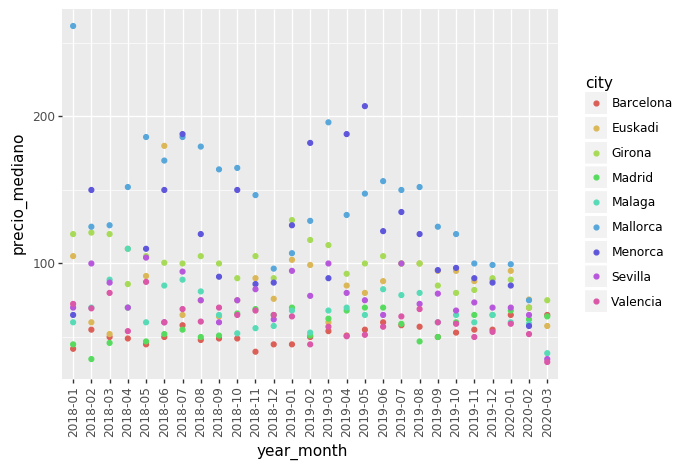

<ggplot: (7582858233)>

In [53]:
ggplot(aes(x='year_month', y='precio_mediano', colour='city'), data=
       precio_ano_mes_ciudad)+geom_point()+theme(axis_text_x = element_text(angle=90))

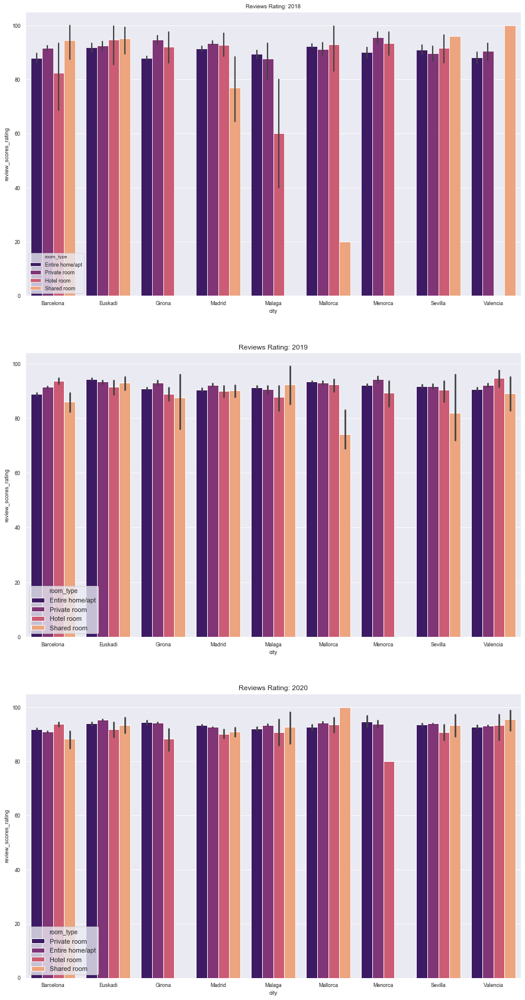

In [54]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows = 3, ncols = 1, figsize = (15,30)) 
ano = 2018
for fila in range(0,3):
    sns.barplot(x = 'city', y = 'review_scores_rating', hue = 'room_type', 
                data = listings[listings['year']== ano], palette = 'magma',ax = axes[fila])
    axes[fila].set_title('Reviews Rating: '+str(ano))
    ano = ano + 1
    sns.set(font_scale=1)

plt.show()

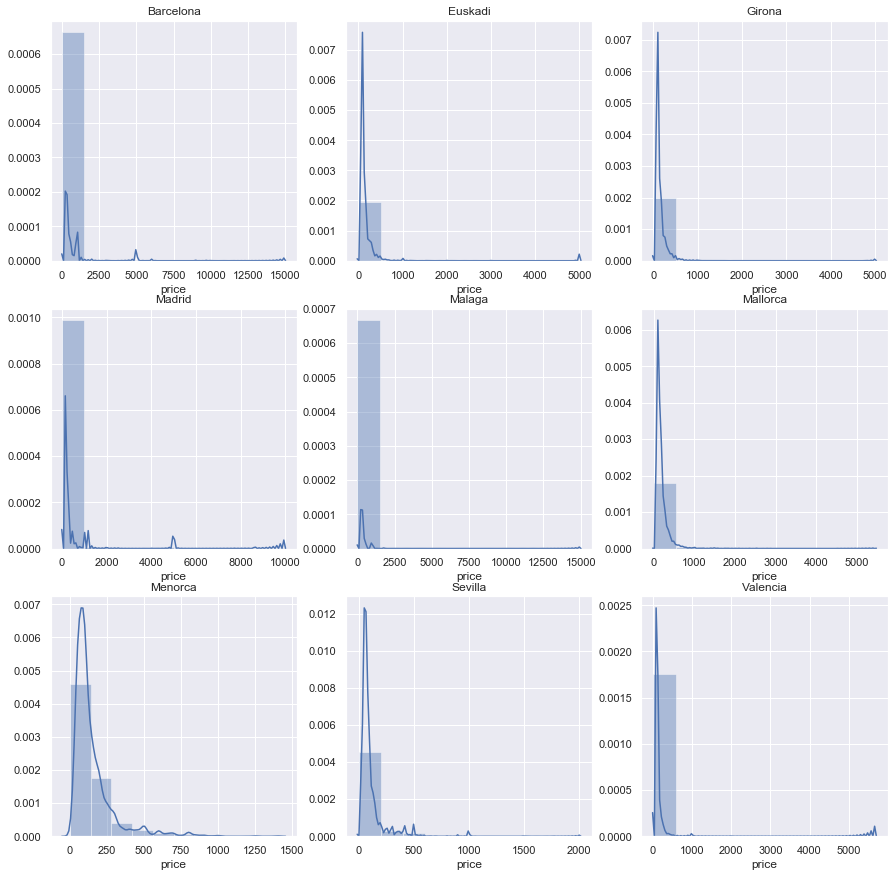

In [55]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,15)) 
etiqueta = 0
for fila in range(0,3):
    for columna in range(0,3):
        sns.distplot(listings[listings['city'] == ciudades[etiqueta]].price, ax = axes[fila][columna], bins = 10)
        axes[fila][columna].set_title(ciudades[etiqueta])
        etiqueta = etiqueta + 1
        sns.set(font_scale=1)

plt.show()

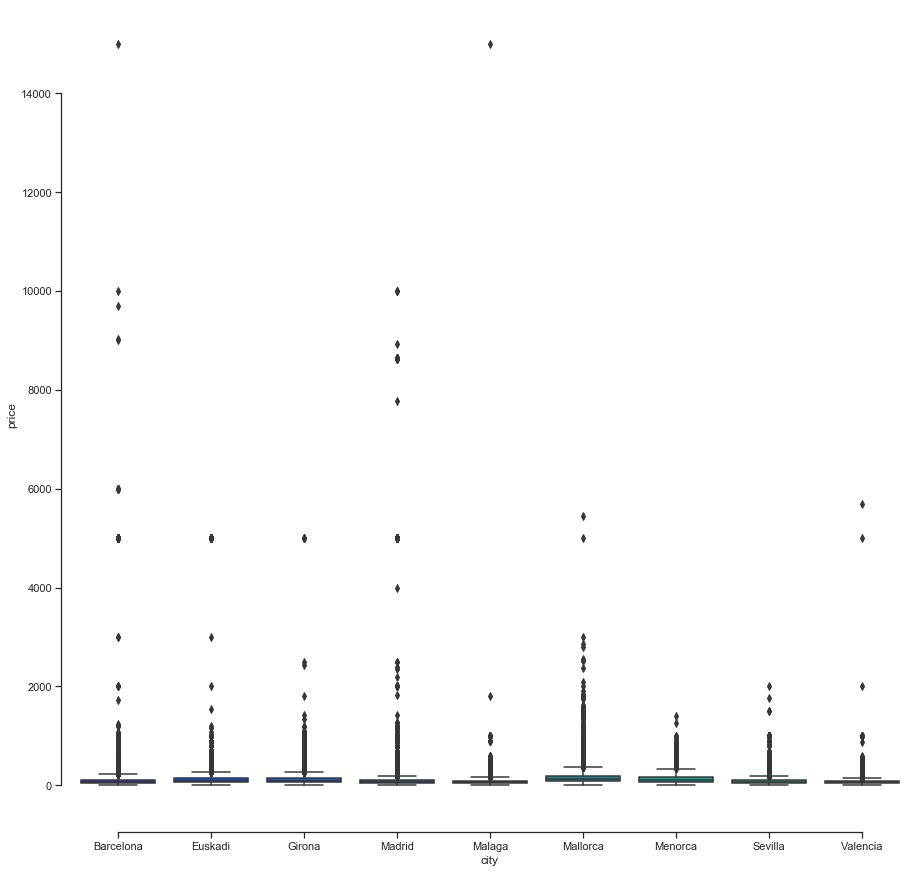

In [56]:
sns.set(style="ticks")
fig, ax = plt.subplots(figsize = (15 , 15))
out = sns.boxplot(x = 'city', y='price', data = listings, palette="winter")
sns.set(font_scale=1)
sns.despine(offset=10, trim=True)

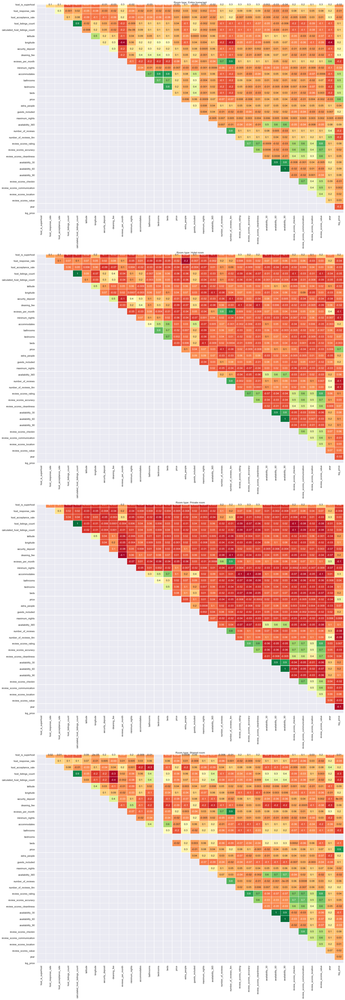

In [57]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows = 4, ncols = 1, figsize = (25,80)) 

rooms = ['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']

for fila in range(0,4):
    mask = np.tril(listings[listings['room_type']==rooms[fila]].corr())
    sns.heatmap(listings[listings['room_type']==rooms[fila]].corr(),annot=True, fmt='.1g', cbar=False,mask=mask, cmap='RdYlGn',linewidths=0.2, ax = axes[fila])
    axes[fila].set_title('Room type: '+ rooms[fila])
    sns.set(font_scale= 1)

plt.show()

In [58]:
corr_table = pd.DataFrame() 
for  ciudad in ciudades:   
  w = pd.DataFrame(listings[listings["city"]==ciudad].drop(columns=["latitude","longitude","price"]).
                   corrwith(listings["price"]), columns= [ciudad])
  corr_table = pd.concat([w,corr_table],axis= 1) 
corr_table.reset_index().rename(columns={"index":"variable"})

,variable,Valencia,Sevilla,Menorca,Mallorca,Malaga,Madrid,Girona,Euskadi,Barcelona
0,host_is_superhost,-0.003940,-0.003362,0.001618,-0.011781,-0.010640,-0.019620,0.000653,-0.014297,0.000719
1,host_response_rate,0.002130,-0.004399,-0.011115,-0.011399,-0.003228,-0.009601,-0.003140,-0.001141,0.012302
2,host_acceptance_rate,-0.005348,-0.000901,0.004722,0.005981,-0.010720,0.019125,-0.001404,0.008168,0.019072
3,host_listings_count,0.006652,0.001192,-0.001391,0.008578,-0.004285,0.048585,0.006980,0.011972,0.036065
4,calculated_host_listings_count,0.002977,0.008383,0.025063,0.010001,-0.002232,0.093846,0.004846,0.010647,0.054697
5,security_deposit,-0.001410,0.003108,0.028705,0.050776,0.007226,0.081062,0.025818,0.016796,0.011398
6,cleaning_fee,0.013465,0.019089,0.006668,0.024912,0.011241,0.080269,0.027847,0.018430,0.038885
7,reviews_per_month,0.000442,-0.006169,-0.004119,-0.022701,-0.014563,-0.028077,-0.017684,-0.013398,-0.019013
8,minimum_nights,0.002348,-0.004979,0.016087,0.004958,-0.002490,-0.005048,0.004686,-0.006032,0.018883
9,accommodates,0.012741,0.014434,0.039103,0.058070,0.013401,0.031447,0.046724,0.027552,0.048933


In [59]:
room_type=list(set(listings["room_type"]))

corr_table = pd.DataFrame() 
for  room in room_type:   
  w = pd.DataFrame(listings[listings["room_type"]==room].drop(columns=["latitude","longitude","price"]).
                   corrwith(listings["price"]), columns= [room])
  corr_table = pd.concat([w,corr_table],axis= 1) 
corr_table.reset_index().rename(columns={"index":"variable"})

,variable,Shared room,Private room,Entire home/apt,Hotel room
0,host_is_superhost,-0.024537,-0.005071,-0.009303,0.032119
1,host_response_rate,0.014012,-0.004069,-0.003975,-0.007714
2,host_acceptance_rate,0.041675,-0.002357,0.005043,-0.013624
3,host_listings_count,-0.028187,0.000627,0.012454,-0.034565
4,calculated_host_listings_count,-0.023957,0.001114,0.015882,-0.032248
5,security_deposit,-0.019013,-0.000356,0.033117,0.002677
6,cleaning_fee,-0.030376,-0.003178,0.029310,-0.020560
7,reviews_per_month,0.017670,-0.008609,-0.014938,-0.031731
8,minimum_nights,-0.008054,0.017534,-0.003076,-0.018597
9,accommodates,-0.017017,0.005677,0.029931,-0.003818


### Variables Categóricas

In [60]:
#####################################
#-----  Variables Categoricas -----#
#####################################

pd.set_option('display.max_columns', None)
listings.describe(include=["O"]).reset_index()

,index,id,listing_url,name,space,summary,description,picture_url,host_id,host_url,host_response_time,street,host_has_profile_pic,property_type,room_type,amenities,neighborhood_overview,calendar_updated,require_guest_phone_verification,require_guest_profile_picture,city,cancellation_policy
0,count,76821,76821,76821,60396,74294,76821,76821,76821,76821,69439,76821,76818,76821,76821,76821,51880,76821,76821,76821,76821,76821
1,unique,76821,76821,75188,56340,69538,73108,76109,39488,39488,4,3993,2,42,4,71415,43162,55,2,2,9,4
2,top,27397660,https://www.airbnb.com/rooms/23211619,Habitación individual,CHECK-IN Y CHECK-OUT: El check-in se realiza ...,.,nan,https://a0.muscache.com/im/pictures/f5c3e2ba-5...,80839530,https://www.airbnb.com/users/show/80839530,within_an_hour,"Madrid, Comunidad de Madrid, Spain",t,Apartment,Entire home/apt,"TV,Wifi,Air conditioning,Kitchen,Elevator,Heat...","The neighbourhood of La Latina in Madrid, also...",today,f,f,Madrid,strict_14_with_grace_period
3,freq,1,1,18,36,60,1116,12,584,584,51386,14151,76657,53378,55561,143,68,16248,75349,76101,16565,38799


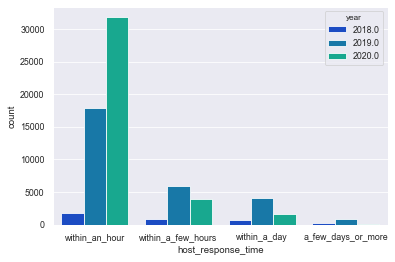

In [189]:
out = sns.countplot(x='host_response_time', hue='year', data=listings, palette = 'winter')

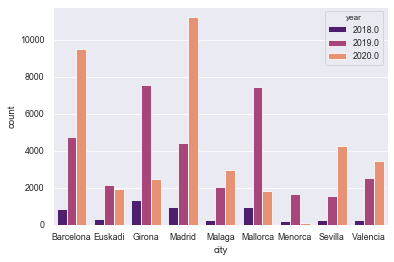

In [185]:
out = sns.countplot(x='city', hue='year', data=listings, palette = 'magma')

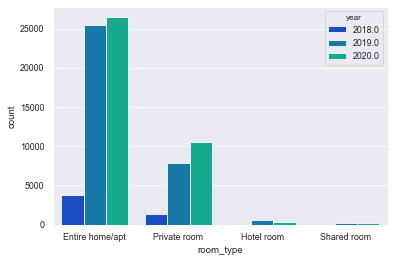

In [190]:
out = sns.countplot(x='room_type', hue='year', data=listings,palette = 'winter')

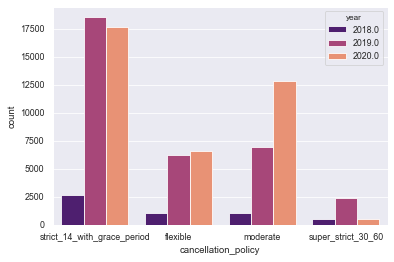

In [188]:
out = sns.countplot(x='cancellation_policy', hue='year', data=listings, palette = 'magma')

In [80]:
listings_eval2 = listings.groupby("city")['space','summary','description'].describe().reset_index()
listings_eval2

city  space                                                            \
              count unique                                                top   
0  Barcelona  11853  10803  Somos una familia nacida en Barcelona muy hosp...   
1    Euskadi   3238   3103  Elciego esta enclavado en pleno corazón de la ...   
2     Girona   8788   8338  CHECK-IN Y CHECK-OUT:  El check-in se realiza ...   
3     Madrid  12897  11882  Combinamos habitaciones asequibles, espacios a...   
4     Malaga   4017   3718  Situado en el centro de la ciudad pero en una ...   
5   Mallorca   8368   8003  Do you want to come and spend your holidays in...   
6    Menorca   1353   1276  Si quieres disfrutar de tus días de descanso b...   
7    Sevilla   5014   4655  It is an Andalusian house fully restored in th...   
8   Valencia   4868   4589  Cuenta con una cama de matrimonio de 1,50 m co...   

       summary                                                                 \
  freq   count unique                                                top freq   
0   27   14365  13136  This bright apartment of 55m2 completely exter...   20   
1    5    4179   4039  Laga Lodge is located in the heart of the Basq...    6   
2   36   11178  10705  Alojamiento en pleno centro hotelero de la ciu...   15   
3   36   15781  14491                                                  .   50   
4   15    5091   4753  Cozy studio in the heart of Malaga, beside Pla...   12   
5   11   10002   9596  Can Cap de Bou is an authentic Majorcan finca ...    8   
6    9    1854   1744  Complejo de apartamentos en la Urbanización de...   16   
7   15    5862   5440  Looking for a different travel experience? Our...   22   
8    7    5982   5674  Modern and central 3 bedrooms apartment with 2...   10   

  description                   
        count unique  top freq  
0       15026  14135  nan  250  
1        4335   4202  nan   69  
2       11371  11072  nan   66  
3       16565  15401  nan  423  
4        5200   4921  nan   64  
5       10227   9921  nan   64  
6        1899   1793  nan   16  
7        5993   5758  nan   49  
8        6205   5929  nan  115

In [81]:
listings_eval3 = listings.groupby("city")['neighborhood_overview','property_type', 'room_type'].describe().reset_index()
listings_eval3

city neighborhood_overview         \
                             count unique   
0  Barcelona                 10673   8272   
1    Euskadi                  2884   2593   
2     Girona                  6730   5895   
3     Madrid                 12006   9735   
4     Malaga                  3488   3034   
5   Mallorca                  5753   4961   
6    Menorca                  1175   1003   
7    Sevilla                  4715   3828   
8   Valencia                  4456   3918   

                                                          property_type  \
                                                 top freq         count   
0  The Eixample is the largest district in Barcel...   36         15026   
1  Gros neighborhood is located in the eastern pa...    9          4335   
2  Estartit es un pueblo pequeño y encantador con...   33         11371   
3  The neighbourhood of La Latina in Madrid, also...   68         16565   
4  En nuestro barrio se encuentra la plaza de la ...   14          5200   
5  Port d'Alcúdia is a modern resort with a wide ...   27         10227   
6                           Very quiet neighborhood.   14          1899   
7  aeropuerto de Sevilla - 15 km Ayuntamiento - 7...   24          5993   
8  The location is perfect for discovering the hi...   18          6205   

                           room_type                                 
  unique        top   freq     count unique              top   freq  
0     28  Apartment  12984     15026      4     Private room   7521  
1     29  Apartment   3120      4335      4  Entire home/apt   2887  
2     34  Apartment   5818     11371      4  Entire home/apt  10484  
3     29  Apartment  13873     16565      4  Entire home/apt  10809  
4     23  Apartment   4324      5200      4  Entire home/apt   4403  
5     33      House   3149     10227      4  Entire home/apt   9044  
6     25  Apartment    573      1899      3  Entire home/apt   1753  
7     22  Apartment   4893      5993      4  Entire home/apt   4843  
8     23  Apartment   5167      6205      4  Entire home/apt   4293

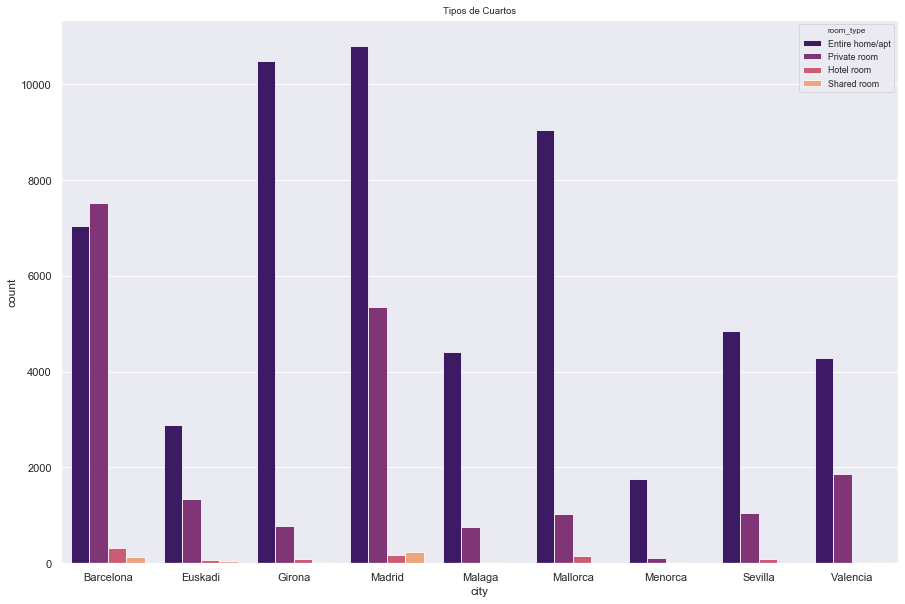

In [64]:
fig, ax = plt.subplots(figsize = (15 , 10))
sns.set_context('paper')
sns.countplot(x = 'city', hue = 'room_type', data = listings, palette = 'magma')
plt.title('Tipos de Cuartos')
plt.show()

### * Feature Engineering

In [65]:
listings_price=listings.drop(columns=['name','property_type','neighborhood_overview','listing_url','require_guest_profile_picture',
                                      'calendar_updated','last_review','first_review','require_guest_phone_verification','year_month',
                                      'space','summary','description','picture_url','host_url','street','host_has_profile_pic'])

In [66]:
pd.set_option('display.max_rows', None)
missing_percent=round(listings_price.isnull().sum()*100/len(listings_price),2)
var_sum=pd.DataFrame({"variable":listings_price.columns,"type_of_var":listings_price.dtypes,
                      "missing_percent":missing_percent}).sort_values("missing_percent", ascending=False).reset_index()
var_sum.drop(columns="index")

,variable,type_of_var,missing_percent
0,security_deposit,float64,21.58
1,cleaning_fee,float64,16.11
2,host_response_time,object,9.61
3,host_response_rate,float64,9.61
4,host_acceptance_rate,float64,2.37
5,review_scores_accuracy,float64,1.36
6,review_scores_cleanliness,float64,1.35
7,review_scores_value,float64,1.35
8,review_scores_location,float64,1.35
9,review_scores_communication,float64,1.35


In [67]:
listings_price_filt=listings_price[listings_price.groupby("room_type")["price"].\
                                   transform(lambda x : (x<=x.quantile(0.995))&(x>=(x.quantile(0.005)))).eq(1)]

In [68]:
print(len(listings_price))
print(len(listings_price_filt))
print("Porcentaje de exclusión: "+str(round((1-(len(listings_price_filt)/len(listings_price)))*100,3))+"%")

76821
76104
Porcentaje de exclusión: 0.933%


In [69]:
room_type_mapping={'Hotel room':4,'Entire home/apt':3,'Private room':2,'Shared room':1}
city_mapping={'Mallorca':9,'Euskadi':8,'Menorca':7,'Barcelona':6,'Madrid':5,'Girona':4,'Sevilla':3,'Malaga':2,'Valencia':1}
canc_policy_mapping={'super_strict_30_60':4,'strict_14_with_grace_period':3,'moderate':2,'flexible':1}
response_time={'within_a_few_hours':4,'within_a_day':3,'within_an_hour':2,'a_few_days_or_more':1}
listings_price_filt['room_type'] = listings_price_filt['room_type'].map(room_type_mapping)
listings_price_filt['city'] = listings_price_filt['city'].map(city_mapping)
listings_price_filt['cancellation_policy'] = listings_price_filt['cancellation_policy'].map(canc_policy_mapping) # convertir en dummies es una B.O
listings_price_filt['host_response_time']=listings_price_filt['host_response_time'].map(response_time)

In [70]:
x = pd.DataFrame(listings_price_filt.drop(columns=["log_price","price"]).
                   corrwith(listings_price_filt["price"]),columns=["Total"]).reset_index()
x["Total_abs"]=x["Total"].apply(lambda y: np.abs(y))
x.sort_values(by="Total_abs", ascending=False)

,index,Total,Total_abs
13,accommodates,0.435358,0.435358
15,bedrooms,0.418016,0.418016
16,beds,0.392881,0.392881
14,bathrooms,0.387421,0.387421
10,cleaning_fee,0.287589,0.287589
8,room_type,0.282780,0.282780
18,guests_included,0.248531,0.248531
9,security_deposit,0.190014,0.190014
33,city,0.158623,0.158623
11,reviews_per_month,-0.151154,0.151154


In [71]:
#Using Pearson Correlation
plt.figure(figsize=(15,10))
cor = listings_price_filt.corr()
cor

,host_is_superhost,host_response_time,host_response_rate,host_acceptance_rate,host_listings_count,calculated_host_listings_count,latitude,longitude,room_type,security_deposit,cleaning_fee,reviews_per_month,minimum_nights,accommodates,bathrooms,bedrooms,beds,price,extra_people,guests_included,maximum_nights,availability_365,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,availability_30,availability_60,availability_90,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,city,year,cancellation_policy,log_price
host_is_superhost,1.000000,-0.062198,0.141882,0.121624,-0.135568,-0.122144,-0.052994,-0.083387,0.007890,-0.012367,-0.030265,0.238098,-0.012216,-0.055607,-0.031931,-0.045688,-0.053594,-0.018781,0.073620,-0.024591,0.009000,-0.019527,0.231668,0.279825,0.285921,0.252725,0.270103,-0.003190,-0.024584,-0.033471,0.208318,0.210073,0.138458,0.273627,0.000766,0.191068,-0.038047,-0.003616
host_response_time,-0.062198,1.000000,0.035197,-0.290343,-0.027795,-0.033699,0.096960,0.159941,-0.022543,0.077301,0.074709,-0.212022,0.050960,0.061235,0.084653,0.093165,0.085708,0.014024,-0.007990,-0.035783,0.011745,0.042765,-0.122119,-0.184093,-0.004604,-0.025859,-0.029018,-0.011545,-0.000456,0.003189,-0.010832,-0.019825,-0.035990,-0.021700,0.077666,-0.187937,0.047580,0.023365
host_response_rate,0.141882,0.035197,1.000000,0.322908,0.010283,0.027869,-0.051478,-0.064029,0.052236,-0.014916,-0.003454,0.151621,-0.041646,0.022842,0.004983,0.007797,0.009156,0.008584,0.012325,0.035618,0.001655,-0.024310,0.115586,0.150420,0.077600,0.075608,0.083865,-0.007725,-0.019332,-0.022092,0.070958,0.092691,0.045442,0.071726,-0.000742,0.181055,0.039210,0.023425
host_acceptance_rate,0.121624,-0.290343,0.322908,1.000000,0.091073,0.079175,-0.079953,-0.054692,0.102361,-0.070481,-0.027493,0.236883,-0.069783,0.014607,-0.025225,-0.016920,-0.013761,0.024862,-0.006986,0.078725,-0.005800,-0.018126,0.143766,0.225382,-0.013957,0.004828,0.023844,-0.004708,-0.014403,-0.015600,-0.008184,-0.002712,0.029076,-0.002752,-0.005918,0.263761,0.076998,0.040374
host_listings_count,-0.135568,-0.027795,0.010283,0.091073,1.000000,0.908105,-0.029164,0.140006,0.132780,0.046564,0.016425,-0.148449,-0.004005,0.157549,0.144406,0.167579,0.142701,0.099968,-0.097734,0.218235,-0.001382,0.041716,-0.115975,-0.126403,-0.110391,-0.106774,-0.063864,-0.043357,-0.018388,-0.000446,-0.150744,-0.131230,-0.072973,-0.101229,0.181754,-0.125666,0.192317,0.158959
calculated_host_listings_count,-0.122144,-0.033699,0.027869,0.079175,0.908105,1.000000,-0.021009,0.141284,0.120621,0.064877,0.014574,-0.138178,0.002749,0.146389,0.140661,0.159277,0.136538,0.106281,-0.084406,0.215101,-0.001252,0.024847,-0.107625,-0.117508,-0.100166,-0.094470,-0.060062,-0.053185,-0.025281,-0.008069,-0.130542,-0.110196,-0.070462,-0.093290,0.178920,-0.122747,0.153465,0.160002
latitude,-0.052994,0.096960,-0.051478,-0.079953,-0.029164,-0.021009,1.000000,0.517411,-0.094230,0.127784,0.084680,-0.106867,0.022137,0.013218,0.030471,0.053481,0.052459,0.042843,-0.026831,-0.027125,0.003386,0.029184,-0.069629,-0.093516,-0.028705,-0.040556,-0.047410,0.109528,0.116088,0.099191,-0.038021,-0.023671,-0.005158,-0.052000,0.397987,-0.097900,0.020011,0.057445
longitude,-0.083387,0.159941,-0.064029,-0.054692,0.140006,0.141284,0.517411,1.000000,0.047322,0.194662,0.237240,-0.294924,0.035352,0.200518,0.197431,0.270705,0.236829,0.132892,-0.082059,0.049164,0.003627,0.094252,-0.179660,-0.236068,-0.041920,-0.065781,-0.077667,0.026007,0.065314,0.073911,-0.040848,-0.048656,-0.063677,-0.071919,0.435809,-0.273830,0.218352,0.199940
room_type,0.007890,-0.022543,0.052236,0.102361,0.132780,0.120621,-0.094230,0.047322,1.000000,0.158320,0.270663,-0.120845,0.006438,0.478464,0.133719,0.352927,0.351125,0.282780,0.006995,0.266418,0.002898,0.147706,-0.035233,-0.060311,-0.005446,0.004099,0.019943,0.003678,0.016318,0.029888,-0.030572,-0.008506,0.020207,-0.042372,-0.008690,-0.045148,0.193563,0.54

<Figure size 1080x720 with 0 Axes>

In [82]:
imr_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imr = imr_mode.fit(listings_price_filt[['beds','bedrooms','bathrooms']])
listings_price_filt[['beds','bedrooms','bathrooms']] = imr.transform(listings_price_filt[['beds','bedrooms','bathrooms']])

In [83]:
imr_constant=SimpleImputer(missing_values=np.nan, strategy='constant')
imr = imr_mode.fit(listings_price_filt[['host_listings_count']])
listings_price_filt[['host_listings_count']] = imr.transform(listings_price_filt[['bathrooms']])

In [84]:
 listings_price_filt[["security_deposit", "cleaning_fee", "host_response_time", "host_response_rate", "host_acceptance_rate", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin",
"review_scores_communication", "review_scores_value", "review_scores_location", "review_scores_rating"]] = listings_price_filt[["security_deposit", "cleaning_fee", "host_response_time", "host_response_rate", "host_acceptance_rate", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin",
"review_scores_communication", "review_scores_value", "review_scores_location", "review_scores_rating"]].fillna(listings_price_filt.groupby('room_type')\
                    [["security_deposit", "cleaning_fee", "host_response_time", "host_response_rate", "host_acceptance_rate", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin",
"review_scores_communication", "review_scores_value", "review_scores_location", "review_scores_rating"]].transform('median'))

In [85]:
#####################################
#-----  Variables continuas -----#
#####################################

d=listings_price_filt[["security_deposit", "cleaning_fee", "host_response_rate", "host_acceptance_rate", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin",
"review_scores_communication", "review_scores_value", "review_scores_location", "review_scores_rating"]].describe(percentiles=[.005,.01,.05,.1,.9,.95,.99,.995])
d.T.reset_index().rename(columns={"index" : "variable"})

,variable,count,mean,std,min,0.5%,1%,5%,10%,50%,90%,95%,99%,99.5%,max
0,security_deposit,76104.0,149.913053,236.088833,0.0,0.0,0.0,0.0,0.0,100.0,300.0,500.0,1000.0,1500.0,4533.0
1,cleaning_fee,76104.0,36.392450,41.725311,0.0,0.0,0.0,0.0,0.0,30.0,80.0,102.0,200.0,250.0,600.0
2,host_response_rate,76104.0,95.928992,12.617236,0.0,0.0,30.0,77.0,89.0,100.0,100.0,100.0,100.0,100.0,100.0
3,host_acceptance_rate,76104.0,91.663644,16.973214,0.0,0.0,13.0,53.0,71.0,99.0,100.0,100.0,100.0,100.0,100.0
4,review_scores_accuracy,76104.0,9.503232,0.927055,2.0,4.0,6.0,8.0,9.0,10.0,10.0,10.0,10.0,10.0,10.0
5,review_scores_cleanliness,76104.0,9.344029,1.006272,2.0,4.0,6.0,8.0,8.0,10.0,10.0,10.0,10.0,10.0,10.0
6,review_scores_checkin,76104.0,9.631912,0.848633,2.0,4.0,6.0,8.0,9.0,10.0,10.0,10.0,10.0,10.0,10.0
7,review_scores_communication,76104.0,9.640650,0.839783,2.0,4.0,6.0,8.0,9.0,10.0,10.0,10.0,10.0,10.0,10.0
8,review_scores_value,76104.0,9.130506,1.004908,2.0,4.0,6.0,8.0,8.0,9.0,10.0,10.0,10.0,10.0,10.0
9,review_scores_location,76104.0,9.600100,0.748101,2.0,6.0,7.0,8.0,9.0,10.0,10.0,10.0,10.0,10.0,10.0


In [86]:
d=listings_price_filt["host_listings_count"].describe().T.reset_index().rename(columns={"index" : "variable"})
d

,variable,host_listings_count
0,count,76104.000000
1,mean,1.489567
2,std,0.870773
3,min,0.000000
4,25%,1.000000
5,50%,1.000000
6,75%,2.000000
7,max,32.000000


## Etapa 4 -  Modelado :

In [102]:
#####################################
#-----  MODELO -----#
#####################################

listings_x=listings_price_filt.drop(columns=["id","host_id","amenities","log_price","price"])
listings_x[["latitude","longitude"]]=listings_x[["latitude","longitude"]].apply(lambda x: round(x,3))
listings_x_y=listings_price_filt.drop(columns=["id","host_id","amenities","log_price"])
#listings_x["host_listings_count"]=listings_x["host_listings_count"].fillna(0, inplace=True)
#listings_x["host_listings_count"]=listings_x["host_listings_count"].apply(lambda x: round(x,0))
#"longitude","latitude"

In [103]:
listings_price_filt.host_listings_count.isnull().sum()

0

In [104]:
listings_x = listings_x.clip(listings_x.quantile(0.005), listings_x.quantile(0.995), axis=1)

In [105]:
listings_price_filt = listings_price_filt.drop(columns = ["log_price"])
listings_price_filt["log_price"] = listings_price_filt["price"].apply(lambda x: round(np.log(x),2))

In [106]:
list_log_price = listings_price_filt["log_price"]
list_price = listings_price_filt["price"]

In [107]:
# Create Decision Tree Regressor
dtr = DecisionTreeRegressor(criterion="mse", random_state=0, min_samples_split=60,min_samples_leaf=20, max_features="auto",
                           min_impurity_decrease=0.01)

# Train Decision Tree Regressor

X_train, X_test, y_train, y_test = train_test_split(listings_x,list_price, test_size=0.3, random_state=1111)
dtr = dtr.fit(X_train,y_train)
y_pred_train=dtr.predict(X_train)
y_pred = dtr.predict(X_test)

In [108]:
print("Precisión:",metrics.r2_score(y_test, y_pred))
print("Precisión:",metrics.r2_score(y_train, y_pred_train))

Precisión: 0.41889083931320814
Precisión: 0.5396758579018384


## Metricas :

In [198]:
print("Precisión:",metrics.r2_score(y_test, y_pred))
print("Precisión:",metrics.mean_absolute_error(y_test, y_pred)) 
print("Precisión:",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("Precisión:",(metrics.mean_squared_error(y_test, y_pred)))

Precisión: 0.3847751671061612
Precisión: 35.4529201656939
Precisión: 108.20950309926042
Precisión: 11709.296560988849


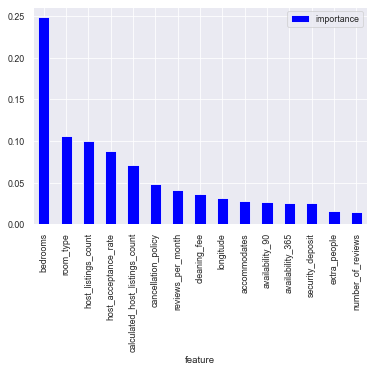

In [109]:
#Plot variable importances for the top 10 predictors

importances = dtr.feature_importances_
feat_names = list(listings_x.columns)
tree_result = pd.DataFrame({'feature': feat_names, 'importance': importances})
tree_result.sort_values(by='importance',ascending=False)[:15].plot(x='feature', y='importance', kind='bar',color='blue')

In [110]:
reg = LinearRegression().fit(X_train, y_train)
print(reg.score(X_test, y_test))
print([(a,b) for a,b in zip(X_test.columns, reg.coef_)])
# print(reg.coef_)
r2_score(y_test, reg.predict(X_test), multioutput='variance_weighted')

0.2376180124204341
[('host_is_superhost', 2.861953800090724), ('host_response_time', -4.533891546762548), ('host_response_rate', 0.008578666672674587), ('host_acceptance_rate', 0.1778319159566786), ('host_listings_count', 16.303227685989736), ('calculated_host_listings_count', 0.012230709909511615), ('latitude', 0.8099295698887577), ('longitude', -1.1837587491628723), ('room_type', 33.458407462725084), ('security_deposit', 0.03822909983404312), ('cleaning_fee', 0.14231139441109913), ('reviews_per_month', -1.899970104865708), ('minimum_nights', -1.2723826223493455), ('accommodates', 7.729992873592697), ('bathrooms', 16.303227685988773), ('bedrooms', 6.247459486938752), ('beds', 0.05166266057708102), ('extra_people', -0.13569577713251513), ('guests_included', 1.9722796273798557), ('maximum_nights', -0.007966246624115967), ('availability_365', 0.04249475582613092), ('number_of_reviews', -0.07566686961247623), ('number_of_reviews_ltm', -0.07439583335102021), ('review_scores_rating', 0.6986

0.2376180124204341

In [111]:
from sklearn.linear_model import ElasticNetCV

ev = ElasticNetCV(cv=10, random_state=0)
ev.fit(X_train, y_train)

print(ev.alpha_)
r2_score(y_test, ev.predict(X_test), multioutput='variance_weighted')

12.322215891361962


0.19029983528133546

In [ ]:
from lightgbm import LGBMRegressor

lgbm = LGBMRegressor(objective='regression', n_jobs=-1, random_state=0,num_iterations=1000,min_gain_to_split = 0.01,
                      # learning_rate = 0.001,
                      # max_depth = 4,
                      min_data_in_leaf = 20,
                      # alpha = 0.5
                       )
lgbm.fit(X_train, y_train, eval_set=(X_test,y_test), eval_metric="r2", early_stopping_rounds=10, verbose=True)
#print([(a,b) for a,b in zip(X_test.columns, lgbm.feature_importances_)])

print(r2_score(y_test, lgbm.predict(X_test), multioutput='variance_weighted'))
print(r2_score(y_train, lgbm.predict(X_train), multioutput='variance_weighted') )

In [175]:
#from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(n_estimators=1000, loss="lad", random_state=0,min_samples_split=60, 
                               min_samples_leaf=20)
gbr=gbr.fit(X_train,y_train)
y_pred = gbr.predict(X_test)

print("Precisión:",metrics.r2_score(y_test, y_pred))
print("Precisión:",metrics.r2_score(y_train, y_pred_train))

#scores = cross_val_score(clf, X_test, y_test, cv=5)
#scores.mean()

Precisión: 0.3847751671061612
Precisión: 0.5396758579018384


In [176]:
preds = pd.DataFrame(y_pred, columns=['price_est'])
Y_test_join=pd.concat([y_test.reset_index(),preds],axis=1)

## Metricas :

In [199]:
print("Precisión:",metrics.r2_score(y_test, y_pred))
print("Precisión:",metrics.mean_absolute_error(y_test, y_pred)) 
print("Precisión:",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("Precisión:",(metrics.mean_squared_error(y_test, y_pred)))

Precisión: 0.3847751671061612
Precisión: 35.4529201656939
Precisión: 108.20950309926042
Precisión: 11709.296560988849


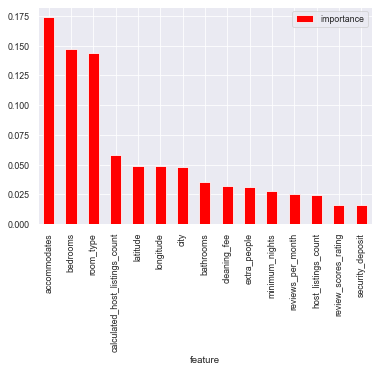

In [179]:
#Plot variable importances for the top 10 predictors

importances = gbr.feature_importances_
feat_names = list(listings_x.columns)
tree_result = pd.DataFrame({'feature': feat_names, 'importance': importances})
tree_result.sort_values(by='importance',ascending=False)[:15].plot(x='feature', y='importance', kind='bar',color='red')

In [ ]:
Y_test_join[["price","prices_est"]]=Y_test_join[["log_price","price_est"]].apply(lambda x: np.exp(x))

In [ ]:
import pandas as pd   # to manipulate dataframes
import numpy as np   # to manipulate arrays

# a number "a" from the vector "x" is an outlier if 
# a > median(x)+1.5*iqr(x) or a < median-1.5*iqr(x)
# iqr: interquantile range = third interquantile - first interquantile
def outliers(x): 
       return np.abs(x- x.median()) > 1.5*(x.quantile(.75)-x.quantile(0.25))

# Give the outliers for the first column for example
df.data1[outliers(df.data1)]
#The function return a boolean vector: True if the element is an outlier. False, otherwise.

#Now, to replace the upper and lower outliers, let's write another small function and apply it on all the dataframe:

# Replace the upper outlier(s) with the 95th percentile and the lower one(s) with the 5th percentile 
def replace(x):   # x is a vector
       out = x[outliers(x)]
       return x.replace(to_replace = [out.min(),out.max()], 
                        value = [np.percentile(x,5),np.percentile(x,95)])

# Apply replace() on each column of the dataframe
df = df.apply(replace,axis=1)

 <img src="sentimientos.jpg">
 
  ## FASE 2  - ANÁLISIS DE SENTIMIENTOS 


In [120]:
#####################################
#-----  Creacion de rutinas -----#
#####################################
def language_detection(text):
    try:
        return detect(text)
    except:
        return None

In [117]:
#reviews['language_description'] = reviews['comments'].apply(language_detection)

In [118]:
#reviews.to_csv(r"C:\Users\KARLITA R\Documents\python\Data Science Trabajo\reviews_coments.csv", index = True, header= True)

## NOTA: Debido a que el tiempo de ejecución es muy largo, se tomó la opción de exportar el archivo.

In [121]:
reviews_1 = pd.read_csv('reviews_coments.csv', sep = ",")

In [122]:
reviews_1 = reviews_1.drop(['Unnamed: 0'], axis = 1)
reviews_1.head(1)

,listing_id,date,comments,language_description
0,23197,2011-03-15,We (5 friends) were staying for a conference i...,en


In [123]:
# Transformar a lower.

reviews_1["comments_lower"]= reviews_1.comments.str.lower()
reviews_1.head(1)

,listing_id,date,comments,language_description,comments_lower
0,23197,2011-03-15,We (5 friends) were staying for a conference i...,en,we (5 friends) were staying for a conference i...


In [124]:
reviews_1.language_description.count()

3088002

In [125]:
#Conteo del número de idiomas.

idiomas = pd.DataFrame(reviews_1.language_description.value_counts().head(10).reset_index())
idiomas.rename(columns={'index':'idioma', 'language_description':'Conteo'}, inplace=True)
idiomas

,idioma,Conteo
0,en,1602770
1,es,783993
2,fr,303888
3,de,99154
4,it,78999
5,pt,41664
6,nl,34083
7,ko,28753
8,ru,28315
9,ca,19581


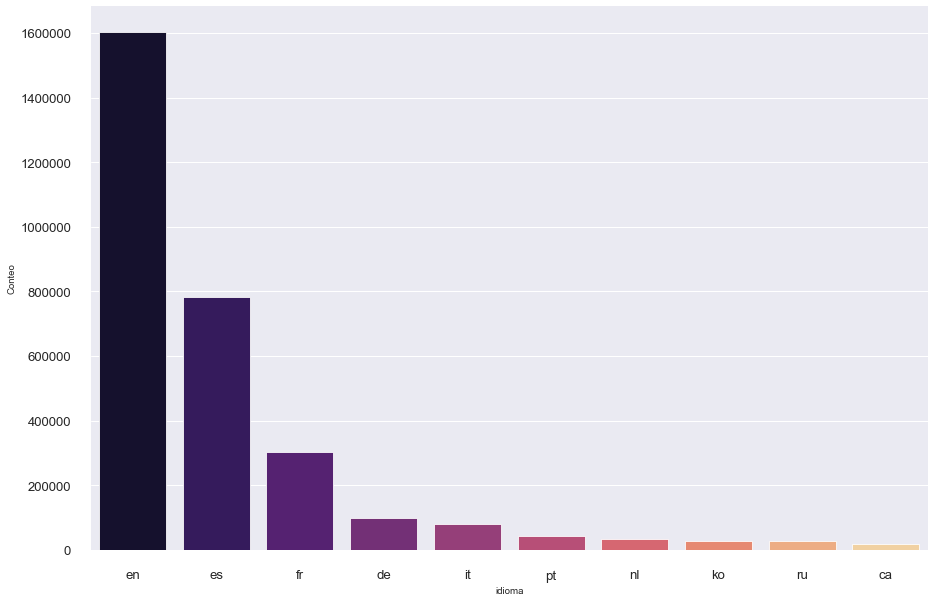

In [126]:
#Gráfico del número de comentarios por idiomas.

fig, ax = plt.subplots(figsize = (15 , 10))
sns.set_context('paper')
sns.barplot(x = 'idioma', y = 'Conteo', data = idiomas, palette = 'magma')
sns.set(font_scale=1.2)
sns.despine(offset=10, trim=True)
plt.show()

Para analizar utilizamos el dataset con los siguientes idiomas:

Inglés forma parte de 52% de los comentarios.
Español forma parte de 25% de los comentarios.
Francés forma parte de 9.8% de los comentarios.
Por lo tanto tomamos el 87 % de los datos como análisis.

In [127]:
reviews_en = reviews_1[(reviews_1['language_description']=='en')]
reviews_es = reviews_1[(reviews_1['language_description']=='es')]
reviews_fr = reviews_1[(reviews_1['language_description']=='fr')]

In [128]:
# Función de wordcloud para cada idioma.

def plot_wordcloud(wordcloud, language):
    plt.figure(figsize=(12, 10))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off")
    plt.title(language + ' Comments\n', fontsize=18, fontweight='bold')
    plt.show()

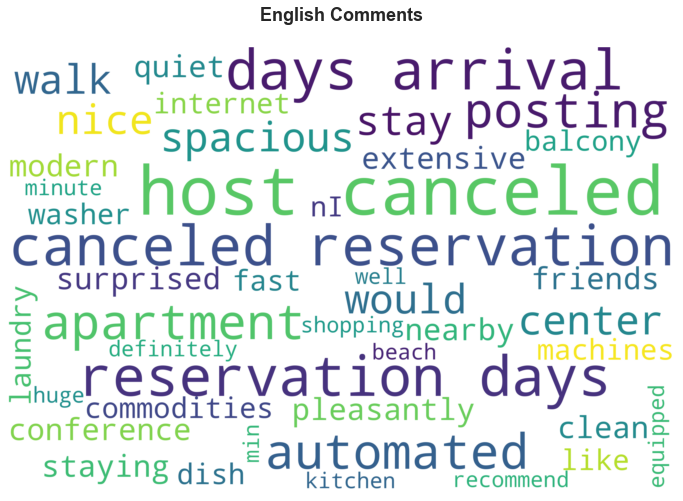

In [129]:
wordcloud = WordCloud(max_font_size=None, max_words=500, background_color="white", 
                      width=3000, height=2000,
                      stopwords=stopwords.words('english')).generate(str(reviews_en.comments.values))

plot_wordcloud(wordcloud, 'English')

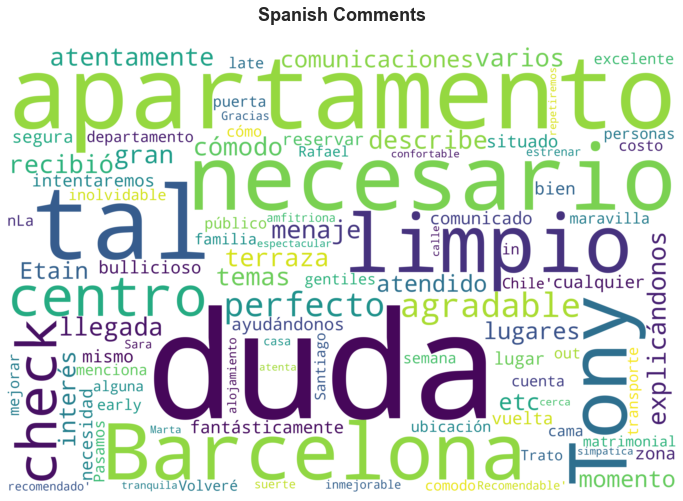

In [130]:
wordcloud = WordCloud(max_font_size=None, max_words=500, background_color="white", 
                      width=3000, height=2000,
                      stopwords=stopwords.words('spanish')).generate(str(reviews_es.comments.values))

plot_wordcloud(wordcloud, 'Spanish')

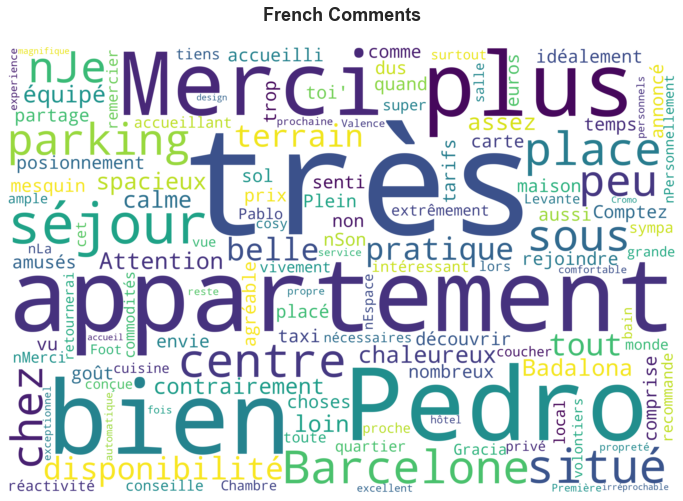

In [132]:
wordcloud = WordCloud(max_font_size=None, max_words=500, background_color="white", 
                      width=3000, height=2000,
                      stopwords=stopwords.words('french')).generate(str(reviews_fr.comments.values))

plot_wordcloud(wordcloud, 'French')

## Analizador de sentimientos :

In [135]:
#####################################
#-----  Analizador -----#
#####################################
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyser = SentimentIntensityAnalyzer()

In [136]:
def sentiment_negative(sentence):
    negative_value = analyser.polarity_scores(sentence)['neg']
    return negative_value

In [137]:
def sentiment_neutral(sentence):
    neutral_value = analyser.polarity_scores(sentence)['neu']
    return neutral_value

In [138]:
def sentiment_positive(sentence):
    positive_value = analyser.polarity_scores(sentence)['pos']
    return positive_value

In [139]:
def sentiment_compound(sentence):
    compound_value = analyser.polarity_scores(sentence)['compound']
    return compound_value

In [191]:
# Analizar los sentimientos de los comentarios en inglés.
# todos estos fueron cargados en drive ya que se demoran mucho el procesamiento

#reviews_en['negativo'] = reviews_en['comments'].apply(sentiment_negative)
#reviews_en['neutro'] = reviews_en['comments'].apply(sentiment_neutral)
#reviews_en['positivo'] = reviews_en['comments'].apply(sentiment_positive)
#reviews_en['compuesto'] = reviews_en['comments'].apply(sentiment_compound)

In [150]:
reviews_en_1 = pd.read_csv('reviews_coments_en.csv', sep = ",")

In [141]:
reviews_en_1['date'] = pd.to_datetime(reviews_en_1['date'], infer_datetime_format=True)
reviews_en_1['year'] = reviews_en_1['date'].apply(lambda x: x.year).astype(float)
reviews_en_1.head(1)

,Unnamed: 0,listing_id,date,comments,language_description,comments_lower,negativo,neutro,positivo,compuesto,year
0,0,23197,2011-03-15,We (5 friends) were staying for a conference i...,en,we (5 friends) were staying for a conference i...,0.0,0.625,0.375,0.9617,2011.0


In [ ]:
#!pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz

import spacy
import en_core_web_sm

nlp = spacy.load("en_core_web_sm")
nlp = en_core_web_sm.load()

tmp = []

for i in reviews_en_1.comments_lower:
    doc = nlp(i)
    q = list(set([token.orth_ for token in doc if token.pos_ == 'ADJ']))
    tmp.append(q)
    
reviews_en_1['adjetivos'] = tmp
reviews_en_1.head(10)

In [ ]:
reviews_en_1 = pd.read_csv('reviews_coments_en_adjetivos.csv', sep = ",", converters={"adjetivos": literal_eval})
reviews_en_1.head(1)

In [ ]:
reviews_en_1 = reviews_en_1.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis = 1)

In [ ]:
adjetivos = pd.DataFrame(reviews_en_1.groupby(['listing_id','year']).apply(lambda x: list(x.adjetivos))).reset_index()
adjetivos.rename(columns={'listing_id':'listing_id', 'year':'year', 0:'adjetivos'},  inplace=True)

def lis(x):
    return [item for lista in x for item in lista]

adjetivos['adjetivos'] = adjetivos.adjetivos.apply(lambda x: lis(x))
adjetivos['listing_id'] = adjetivos.listing_id.astype(str)

adjetivos.head(20)

In [ ]:
#promedio de valoración de sentimientos por sitio.

rev_en =reviews_en_1.groupby(['listing_id', 'year']).agg({'comments':'count','compuesto':'mean'}).reset_index()
rev_en['listing_id'] = rev_en.listing_id.astype(str)

In [ ]:
rev_en.head(20)

In [ ]:
res = pd.DataFrame(rev_en.sort_values('year').set_index('year').groupby('listing_id').apply(lambda x: x['compuesto'].diff()).reset_index())

In [ ]:
res.rename(columns = {'listing_id':'listing_id', 'year':'year', 'compuesto':'compuesto_var'}, inplace = True)

In [ ]:
rev_en = rev_en.sort_values(['listing_id', 'year'], ascending=False)
rev_en['listing_id'] = rev_en.listing_id.astype(str)
reviews_var = pd.merge(rev_en, res, how='left', on=['listing_id', 'year']).sort_values(['listing_id', 'year'], ascending=True)
reviews_var = reviews_var[['listing_id', 'year', 'comments', 'compuesto', 'compuesto_var']]

In [ ]:
reviews_var.head(20)

In [ ]:
def sentimiento (x):
    if x >= 0.05:
        return 'positivo'
    elif x <= -0.05:
        return 'negativo'
    else:
        return 'neutro'
    
reviews_var['sentimiento'] = reviews_var.apply(lambda x: sentimiento(x.compuesto) , axis=1)    

In [ ]:
reviews_var.head(10)

In [ ]:
fig, axes = plt.subplots(nrows = 3, ncols = 1, figsize = (15,15)) 
sentimientos = list(set(reviews_var.sentimiento))
etiqueta = 0
for fila, sentimiento in zip(range(0,3),sentimientos):
    sns.distplot(reviews_var[reviews_var['sentimiento'] == sentimiento].compuesto, ax = axes[fila])
    axes[fila].set_title(sentimiento)
    sns.set(font_scale=0.8)

plt.show()

In [ ]:
reviews_va = pd.merge(reviews_var, adjetivos, how='left', on=['listing_id', 'year']).sort_values(['listing_id', 'year'], ascending=True)
reviews_va.head(20)

In [ ]:
def text(x):
    return ", ".join(x)

reviews_va['adjetivos'] = reviews_va.adjetivos.apply(lambda x: text(x))

In [ ]:
reviews_va.head(1)

In [ ]:
description_wordcloud = WordCloud(stopwords=stopwords.words('english'), background_color = 'white', height = 2000, width = 4000).generate(str(reviews_va[reviews_va.sentimiento== 'positivo'].adjetivos.values))
plt.figure(figsize = (16,8))
plt.imshow(description_wordcloud)
plt.axis('off')
plt.title(' Adjetivos Sitios con Sentimiento Positivo\n', fontsize=18, fontweight='bold')
plt.show()

In [ ]:
description_wordcloud = WordCloud(stopwords=stopwords.words('english'), background_color = 'white', height = 2000, width = 4000).generate(str(reviews_va[reviews_va.sentimiento== 'negativo'].adjetivos.values))
plt.figure(figsize = (16,8))
plt.imshow(description_wordcloud)
plt.axis('off')
plt.title(' Adjetivos Sitios con Sentimiento Negativo\n', fontsize=18, fontweight='bold')
plt.show()

In [ ]:
description_wordcloud = WordCloud(stopwords=stopwords.words('english'), background_color = 'white', height = 2000, width = 4000).generate(str(reviews_va[reviews_va.sentimiento== 'neutro'].adjetivos.values))
plt.figure(figsize = (16,8))
plt.imshow(description_wordcloud)
plt.axis('off')
plt.title(' Adjetivos Sitios con Sentimiento Neutro\n', fontsize=18, fontweight='bold')
plt.show()

In [ ]:
listings["log_price"]=listings["price"].apply(lambda x: np.log(x+1))

In [ ]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,15)) 
etiqueta = 0
for fila in range(0,3):
    for columna in range(0,3):
        sns.distplot(listings[listings['city'] == ciudades[etiqueta]].log_price, ax = axes[fila][columna])
        axes[fila][columna].set_title(ciudades[etiqueta])
        etiqueta = etiqueta + 1
        sns.set(font_scale=1)

plt.show()

In [ ]:
sns.set(style="ticks")
fig, ax = plt.subplots(figsize = (15 , 15))
out = sns.boxplot(x = 'city', y='log_price', data = listings, palette="winter")
sns.set(font_scale=1)
sns.despine(offset=10, trim=True)

In [ ]:
listings_recon = listings

In [ ]:
listings_recon['name_low'] = listings_recon.name.str.lower()
listings_recon['description_low'] = listings_recon.description.str.lower()
listings_recon['space_low']= listings_recon.space.str.lower()

In [ ]:
listings_recon.head(20)

In [ ]:
#####################################
#-----  Creacion de rutinas -----#
#####################################
stopword = stopwords.words('english')

def digitos(x):
    try:
        return ''.join(c for c in x if not c.isdigit())
    except:
        return x

def puntuacion(x):
    try:
        return ''.join(c for c in x if c not in punctuation)
    except:
        return x

def stop(x):
    try:
        word_tokens = nltk.word_tokenize(x)
        return ' '.join(word for word in word_tokens if word not in stopword) 
    except:
        return x

def especiales(x):
    try:
        for k in x.split("\n"):
            y = re.sub(r"[^a-zA-Z0-9]+", ' ', k)
        return y
    except:
        return x
    
listings_recon['name_low'] = listings_recon.name_low.apply(lambda x: digitos(x))
listings_recon['name_low'] = listings_recon.name_low.apply(lambda x: puntuacion(x))
listings_recon['name_low'] = listings_recon.name_low.apply(lambda x: stop(x))
listings_recon['name_low'] = listings_recon.name_low.apply(lambda x: especiales(x))

listings_recon['description_low'] = listings_recon.description_low.apply(lambda x: digitos(x))
listings_recon['description_low'] = listings_recon.description_low.apply(lambda x: puntuacion(x))
listings_recon['description_low'] = listings_recon.description_low.apply(lambda x: stop(x))
listings_recon['description_low'] = listings_recon.description_low.apply(lambda x: especiales(x))

listings_recon['space_low'] = listings_recon.space_low.apply(lambda x: digitos(x))
listings_recon['space_low'] = listings_recon.space_low.apply(lambda x: puntuacion(x))
listings_recon['space_low'] = listings_recon.space_low.apply(lambda x: stop(x))
listings_recon['space_low'] = listings_recon.space_low.apply(lambda x: especiales(x))

In [ ]:
listings_recon.head(1)

In [ ]:
listings_recomen = pd.merge(listings_recon, reviews_va, how='left', left_on=['id', 'year'], right_on = ['listing_id', 'year'])

In [ ]:
listings_recomen.head(10)

In [ ]:
listings_recomen['content'] = listings_recomen[['name_low','description_low']].astype(str).apply(lambda x: ' // '.join(x), axis = 1)

In [ ]:
# Fillna

listings_recomen['content'].fillna('Null', inplace = True)

In [ ]:
from sklearn.impute import SimpleImputer

imr_mode = SimpleImputer(missing_values=np.nan, strategy='constant')

imr = imr_mode.fit(listings_recomen[['review_scores_rating','sentimiento']])
listings_recomen[['review_scores_rating','sentimiento']] = imr.transform(listings_recomen[['review_scores_rating','sentimiento']])

In [ ]:
listings_recomen.sentimiento.isnull().sum()

In [ ]:
#####################################
#-----  Archivo de salida -----#
#####################################
listings_recomen.to_csv("listings_recomen.csv", index = True, header= True)